In [1]:
import pandas as pd

c:\Users\danny\anaconda3\envs\py310\lib\site-packages\pandas\core\arrays\masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [3]:
to_submit = pd.read_csv('sample_submission.csv')

In [4]:
# Convert time_stamp to datetime
train_df['time_stamp'] = pd.to_datetime(train_df['time_stamp'], format='mixed')
test_df['time_stamp'] = pd.to_datetime(test_df['time_stamp'], format='mixed')

# Create a total_seconds column (Unix timestamp)
# Using int64 (nanoseconds) to preserve full precision and ensure uniqueness
train_df['total_seconds'] = train_df['time_stamp'].astype('int64')
test_df['total_seconds'] = test_df['time_stamp'].astype('int64')

In [5]:
train_df

,label,time_stamp,traj_ind,x,y,z,total_seconds
0,1,2015-12-29 14:50:34.045000,0,0.814803,0.023350,0.068439,1451400634045000000
1,1,2015-12-29 14:50:34.095000,0,0.811802,0.015569,0.068855,1451400634095000000
2,1,2015-12-29 14:50:34.145000,0,0.808880,0.007757,0.073745,1451400634145000000
3,1,2015-12-29 14:50:34.195000,0,0.806039,-0.000084,0.073402,1451400634195000000
4,1,2015-12-29 14:50:34.245000,0,0.803278,-0.007953,0.075000,1451400634245000000
...,...,...,...,...,...,...,...
1021971,0,2013-04-20 05:08:58.290836,32740,0.595844,0.098093,0.013458,1366434538290836000
1021972,0,2013-04-20 05:08:58.340836,32740,0.599881,0.099361,0.010667,1366434538340836000
1021973,0,2013-04-20 05:08:58.340836,32740,0.603904,0.100674,0.007421,1366434538340836000
1021974,0,2013-04-20 05:08:58.340836,32740,0.607912,0.102032,0.003101,1366434538340836000


In [6]:
train_df[train_df['traj_ind'] == 0].sort_values('total_seconds')

,label,time_stamp,traj_ind,x,y,z,total_seconds
0,1,2015-12-29 14:50:34.045,0,0.814803,0.023350,0.068439,1451400634045000000
1,1,2015-12-29 14:50:34.095,0,0.811802,0.015569,0.068855,1451400634095000000
2,1,2015-12-29 14:50:34.145,0,0.808880,0.007757,0.073745,1451400634145000000
3,1,2015-12-29 14:50:34.195,0,0.806039,-0.000084,0.073402,1451400634195000000
4,1,2015-12-29 14:50:34.245,0,0.803278,-0.007953,0.075000,1451400634245000000
5,1,2015-12-29 14:50:34.295,0,0.800599,-0.015851,0.076689,1451400634295000000
6,1,2015-12-29 14:50:34.345,0,0.798000,-0.023776,0.080064,1451400634345000000
7,1,2015-12-29 14:50:34.395,0,0.795484,-0.031727,0.077065,1451400634395000000
8,1,2015-12-29 14:50:34.445,0,0.793049,-0.039704,0.077875,1451400634445000000
9,1,2015-12-29 14:50:34.495,0,0.790697,-0.047705,0.076800,1451400634495000000


In [7]:
import plotly.express as px
import plotly.graph_objects as go

def plot_trajectory(traj_ind, df=train_df):
    # Ensure points are ordered by total_seconds
    subset = df[df['traj_ind'] == traj_ind].sort_values('total_seconds')
    
    fig = px.line_3d(subset, x='x', y='y', z='z', title=f'Trajectory {traj_ind}', markers=True)
    
    # Mark the first point as square
    if len(subset) > 0:
        start_pt = subset.iloc[0]
        fig.add_trace(go.Scatter3d(
            x=[start_pt['x']],
            y=[start_pt['y']],
            z=[start_pt['z']],
            mode='markers',
            marker=dict(size=10, symbol='square', color='red'),
            name='Start'
        ))
    
    fig.show()

# Example usage:
# plot_trajectory(0)

In [8]:
plot_trajectory(0)

In [9]:
# Create a new dataframe with the first row for each traj_ind
traj_starts_df = train_df.sort_values(['traj_ind', 'total_seconds']).drop_duplicates('traj_ind', keep='first').copy()

# Add date time columns
traj_starts_df['year'] = traj_starts_df['time_stamp'].dt.year
traj_starts_df['month'] = traj_starts_df['time_stamp'].dt.month
traj_starts_df['day'] = traj_starts_df['time_stamp'].dt.day
traj_starts_df['hour'] = traj_starts_df['time_stamp'].dt.hour
traj_starts_df['minute'] = traj_starts_df['time_stamp'].dt.minute
traj_starts_df['second'] = traj_starts_df['time_stamp'].dt.second
traj_starts_df['microsecond'] = traj_starts_df['time_stamp'].dt.microsecond

traj_starts_df.head()

,label,time_stamp,traj_ind,x,y,z,total_seconds,year,month,day,hour,minute,second,microsecond
0,1,2015-12-29 14:50:34.045000,0,0.814803,0.023350,0.068439,1451400634045000000,2015,12,29,14,50,34,45000
31,1,2015-12-29 14:50:35.846440,1,0.814803,0.023350,0.068439,1451400635846440000,2015,12,29,14,50,35,846440
62,1,2015-12-29 14:50:37.647880,2,0.814803,0.023350,0.068439,1451400637647880000,2015,12,29,14,50,37,647880
93,1,2015-12-29 14:50:39.449320,3,0.814803,0.023350,0.068439,1451400639449320000,2015,12,29,14,50,39,449320
124,1,2013-08-23 23:46:53.847000,4,0.972511,0.141725,0.061404,1377301613847000000,2013,8,23,23,46,53,847000


In [10]:
traj_starts_df

,label,time_stamp,traj_ind,x,y,z,total_seconds,year,month,day,hour,minute,second,microsecond
0,1,2015-12-29 14:50:34.045000,0,0.814803,0.023350,0.068439,1451400634045000000,2015,12,29,14,50,34,45000
31,1,2015-12-29 14:50:35.846440,1,0.814803,0.023350,0.068439,1451400635846440000,2015,12,29,14,50,35,846440
62,1,2015-12-29 14:50:37.647880,2,0.814803,0.023350,0.068439,1451400637647880000,2015,12,29,14,50,37,647880
93,1,2015-12-29 14:50:39.449320,3,0.814803,0.023350,0.068439,1451400639449320000,2015,12,29,14,50,39,449320
124,1,2013-08-23 23:46:53.847000,4,0.972511,0.141725,0.061404,1377301613847000000,2013,8,23,23,46,53,847000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1021776,1,2014-07-16 03:17:33.609953,32736,0.763799,0.101093,0.112362,1405480653609953000,2014,7,16,3,17,33,609953
1021832,1,2014-07-16 03:17:34.605906,32737,0.763799,0.101093,0.112362,1405480654605906000,2014,7,16,3,17,34,605906
1021888,1,2014-07-16 03:17:35.601858,32738,0.763799,0.101093,0.112362,1405480655601858000,2014,7,16,3,17,35,601858
1021944,0,2013-04-20 05:08:53.365000,32739,0.550633,0.087130,0.018797,1366434533365000000,2013,4,20,5,8,53,365000


In [11]:
# Sort the dataframe to ensure correct difference calculation
train_df = train_df.sort_values(['traj_ind', 'time_stamp'])

# Calculate time difference in seconds (using float for precision)
dt = train_df.groupby('traj_ind')['time_stamp'].diff().dt.total_seconds()

# Calculate position differences
dx = train_df.groupby('traj_ind')['x'].diff()
dy = train_df.groupby('traj_ind')['y'].diff()
dz = train_df.groupby('traj_ind')['z'].diff()

# Calculate velocity components
train_df['v_x'] = dx / dt
train_df['v_y'] = dy / dt
train_df['v_z'] = dz / dt

# Calculate speed
train_df['speed'] = (train_df['v_x']**2 + train_df['v_y']**2 + train_df['v_z']**2)**0.5

train_df.head()

,label,time_stamp,traj_ind,x,y,z,total_seconds,v_x,v_y,v_z,speed
0,1,2015-12-29 14:50:34.045,0,0.814803,0.023350,0.068439,1451400634045000000,NaN,NaN,NaN,NaN
1,1,2015-12-29 14:50:34.095,0,0.811802,0.015569,0.068855,1451400634095000000,-0.060037,-0.155620,0.008328,0.167007
2,1,2015-12-29 14:50:34.145,0,0.808880,0.007757,0.073745,1451400634145000000,-0.058434,-0.156229,0.097794,0.193354
3,1,2015-12-29 14:50:34.195,0,0.806039,-0.000084,0.073402,1451400634195000000,-0.056825,-0.156821,-0.006845,0.166939
4,1,2015-12-29 14:50:34.245,0,0.803278,-0.007953,0.075000,1451400634245000000,-0.055210,-0.157397,0.031949,0.169831


In [12]:
# Calculate max speed per trajectory
max_speed = train_df.groupby('traj_ind')['speed'].max().rename('max_speed')

# Calculate initial launch speed (first valid speed value per trajectory)
# Since the first point has NaN speed due to diff(), we take the first non-null value
initial_speed = train_df.groupby('traj_ind')['speed'].first().rename('initial_speed')

# Merge these back into the main dataframe
train_df = train_df.merge(max_speed, on='traj_ind', how='left')
train_df = train_df.merge(initial_speed, on='traj_ind', how='left')



In [13]:
# Add max_speed and initial_speed to traj_starts_df
traj_starts_df = traj_starts_df.merge(max_speed, on='traj_ind', how='left')
traj_starts_df = traj_starts_df.merge(initial_speed, on='traj_ind', how='left')

In [14]:
# Calculate max x, y, z per trajectory
max_positions = train_df.groupby('traj_ind')[['x', 'y', 'z']].max().add_prefix('max_')

# Merge into traj_starts_df
traj_starts_df = traj_starts_df.merge(max_positions, on='traj_ind', how='left')


In [15]:
traj_starts_df.label.unique()

array([1, 0, 2], dtype=int64)

In [16]:
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# Get unique trajectory IDs
all_traj_inds = train_df['traj_ind'].unique()

# Sample if there are too many (e.g., > 100) to keep the plot responsive
if len(all_traj_inds) > 1000:
    selected_inds = np.random.choice(all_traj_inds, 100, replace=False)
    plot_subset = train_df[train_df['traj_ind'].isin(selected_inds)].copy()
    title_text = '3D Trajectories (Random Sample of 100)'
else:
    plot_subset = train_df.copy()
    title_text = '3D Trajectories (All)'

# Convert label to string for discrete coloring
plot_subset['label'] = plot_subset['label'].astype(str)

# Create the line plot
fig = px.line_3d(plot_subset, x='x', y='y', z='z',
                 color='label', line_group='traj_ind',
                 title=title_text,
                 hover_data=['traj_ind', 'speed'])

# Get start and end points for the selected trajectories
# Ensure we are sorting by time to get true start and end
sorted_subset = plot_subset.sort_values(['traj_ind', 'total_seconds'])
start_points = sorted_subset.groupby('traj_ind').first().reset_index()
end_points = sorted_subset.groupby('traj_ind').last().reset_index()

# Create scatter plots for start/end points to get correct coloring
fig_starts = px.scatter_3d(start_points, x='x', y='y', z='z', color='label', hover_data=['traj_ind'])
fig_starts.update_traces(marker=dict(size=3, symbol='square', opacity=0.7))

fig_ends = px.scatter_3d(end_points, x='x', y='y', z='z', color='label', hover_data=['traj_ind'])
# Make end points less prominent
fig_ends.update_traces(marker=dict(size=3, symbol='diamond', opacity=0.7))

# Add traces to main fig
for trace in fig_starts.data:
    trace.showlegend = False
    trace.name = 'Start'
    fig.add_trace(trace)

for trace in fig_ends.data:
    trace.showlegend = False
    trace.name = 'End'
    fig.add_trace(trace)

fig.show()

c:\Users\danny\anaconda3\envs\py310\lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

c:\Users\danny\anaconda3\envs\py310\lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [17]:
# Create 2D figure of initial and final points
# We'll use all data for the 2D plot
traj_ends_df = train_df.sort_values(['traj_ind', 'total_seconds']).drop_duplicates('traj_ind', keep='last').copy()

# Prepare data for plotting
starts_2d = traj_starts_df[['traj_ind', 'x', 'y', 'label']].copy()
starts_2d['Point Type'] = 'Start'

ends_2d = traj_ends_df[['traj_ind', 'x', 'y', 'label']].copy()
ends_2d['Point Type'] = 'End'

combined_2d = pd.concat([starts_2d, ends_2d])
combined_2d['label'] = combined_2d['label'].astype(str)

fig_2d = px.scatter(combined_2d, x='x', y='y', color='label', symbol='Point Type',
                    title='Initial and Final Points (2D)',
                    symbol_map={'Start': 'square', 'End': 'triangle-up'},
                    hover_data=['traj_ind'])
fig_2d.show()

In [18]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d

def resample_trajectory(df, n_points=100):
    # Sort by time
    df = df.sort_values('total_seconds')
    
    # Get values
    x = df['x'].values
    y = df['y'].values
    z = df['z'].values
    t = df['total_seconds'].values
    
    # Handle single point trajectories (edge case)
    if len(t) < 2:
        return np.tile(np.array([x[0], y[0], z[0]]), n_points)
    
    # Normalize time to 0-1
    t_norm = (t - t[0]) / (t[-1] - t[0]) if t[-1] > t[0] else np.zeros_like(t)
    
    # Create interpolation functions
    # We use linear interpolation
    fx = interp1d(t_norm, x, kind='linear', fill_value="extrapolate")
    fy = interp1d(t_norm, y, kind='linear', fill_value="extrapolate")
    fz = interp1d(t_norm, z, kind='linear', fill_value="extrapolate")
    
    # New time points
    t_new = np.linspace(0, 1, n_points)
    
    # Resample
    x_new = fx(t_new)
    y_new = fy(t_new)
    z_new = fz(t_new)
    
    # Concatenate into a single vector [x0, x1..., y0, y1..., z0, z1...]
    return np.concatenate([x_new, y_new, z_new])

print("Resampling train trajectories...")
# Apply to train
train_resampled_list = []
train_indices = []
for traj_id, group in train_df.groupby('traj_ind'):
    train_resampled_list.append(resample_trajectory(group))
    train_indices.append(traj_id)

X_train_ts = pd.DataFrame(train_resampled_list, index=train_indices)
X_train_ts.columns = [f'val_{i}' for i in range(X_train_ts.shape[1])]

print("Resampling test trajectories...")
# Apply to test
test_resampled_list = []
test_indices = []
for traj_id, group in test_df.groupby('traj_ind'):
    test_resampled_list.append(resample_trajectory(group))
    test_indices.append(traj_id)

X_test_ts = pd.DataFrame(test_resampled_list, index=test_indices)
X_test_ts.columns = [f'val_{i}' for i in range(X_test_ts.shape[1])]

print(f"Resampled shape: {X_train_ts.shape}")

Resampling train trajectories...


c:\Users\danny\anaconda3\envs\py310\lib\site-packages\scipy\interpolate\_interpolate.py:701: RuntimeWarning:

divide by zero encountered in divide

c:\Users\danny\anaconda3\envs\py310\lib\site-packages\scipy\interpolate\_interpolate.py:704: RuntimeWarning:

invalid value encountered in multiply



Resampling test trajectories...
Resampled shape: (32741, 300)


In [19]:
# Handle NaNs and Infs from interpolation
X_train_ts = X_train_ts.replace([np.inf, -np.inf], np.nan).fillna(0)
X_test_ts = X_test_ts.replace([np.inf, -np.inf], np.nan).fillna(0)

# Define y_train_full if not exists
if 'y_train_full' not in locals():
    y_train_full = train_df.groupby('traj_ind')['label'].first()

# Align labels
y_train_ts = y_train_full.loc[X_train_ts.index]

# Split for validation
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

X_train_t, X_val_t, y_train_t, y_val_t = train_test_split(X_train_ts, y_train_ts, test_size=0.2, random_state=42)

# Model 1: Time Series Features Only
print("Training Model 1: Time Series Features Only (Random Forest)...")
rf_ts = RandomForestClassifier(n_estimators=100, random_state=42)
rf_ts.fit(X_train_t, y_train_t)

y_pred_ts = rf_ts.predict(X_val_t)
print("\nModel 1 Validation Results:")
print(classification_report(y_val_t, y_pred_ts))
print(f"Accuracy: {accuracy_score(y_val_t, y_pred_ts):.4f}")

# Model 2: Combined Features
# We need X_train_raw for this. If it's not defined, we skip this part or define it.
if 'X_train_raw' in locals():
    print("\nTraining Model 2: Combined Features...")
    # Combine TS features with previous aggregated features
    # Ensure indices match
    X_train_combined = pd.concat([X_train_raw, X_train_ts], axis=1)
    # Handle any missing indices if any (should be fine)
    X_train_combined = X_train_combined.loc[y_train_full.index]

    # Split
    X_train_c, X_val_c, y_train_c, y_val_c = train_test_split(X_train_combined, y_train_full, test_size=0.2, random_state=42)

    rf_combined = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_combined.fit(X_train_c, y_train_c)

    y_pred_c = rf_combined.predict(X_val_c)
    print("\nModel 2 Validation Results:")
    print(classification_report(y_val_c, y_pred_c))
    print(f"Accuracy: {accuracy_score(y_val_c, y_pred_c):.4f}")
else:
    print("\nSkipping Model 2 (Combined) as X_train_raw is not defined.")

# Model 3: Previous Info Only (Recap)
if 'X_train_raw' in locals():
    print("\nModel 3: Previous Aggregated Features Only (Recap)...")
    X_train_p, X_val_p, y_train_p, y_val_p = train_test_split(X_train_raw, y_train_full, test_size=0.2, random_state=42)
    rf_prev = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_prev.fit(X_train_p, y_train_p)
    y_pred_p = rf_prev.predict(X_val_p)
    print(f"Accuracy: {accuracy_score(y_val_p, y_pred_p):.4f}")

Training Model 1: Time Series Features Only (Random Forest)...

Model 1 Validation Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4472
           1       0.99      0.99      0.99      1589
           2       0.99      0.98      0.99       488

    accuracy                           1.00      6549
   macro avg       0.99      0.99      0.99      6549
weighted avg       1.00      1.00      1.00      6549

Accuracy: 0.9956

Skipping Model 2 (Combined) as X_train_raw is not defined.


In [21]:
# # Feature Importance for Combined Model
# importances = rf_combined.feature_importances_
# feature_names = list(X_train_raw.columns) + [f'ts_{i}' for i in range(X_train_ts.shape[1])]
# feature_imp_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
# feature_imp_df = feature_imp_df.sort_values('importance', ascending=False)

# print("Top 20 Features in Combined Model:")
# print(feature_imp_df.head(20))

In [23]:
# # Retrain best model (Scalar Features) on full data
# print("Retraining best model (Scalar Features) on full dataset...")
# rf_final = RandomForestClassifier(n_estimators=100, random_state=42)
# rf_final.fit(X_train_raw, y_train_full)

# # Predict on test set
# # Ensure X_test_raw is aligned and ready
# missing_cols = set(X_train_raw.columns) - set(X_test_raw.columns)
# if missing_cols:
#     print(f"Warning: Missing columns in test set: {missing_cols}")
#     # Add missing columns with 0
#     for col in missing_cols:
#         X_test_raw[col] = 0
#     # Reorder
#     X_test_raw = X_test_raw[X_train_raw.columns]
# else:
#     print("Columns match.")

# y_test_pred = rf_final.predict(X_test_raw)

# # Create submission DataFrame
# # X_test_raw index should be traj_ind
# submission = pd.DataFrame({
#     'traj_ind': X_test_raw.index,
#     'label': y_test_pred
# })

# # Verify shape
# print(f"Submission shape: {submission.shape}")

# # Save
# submission.to_csv('submission_best_scalar.csv', index=False)
# print("Saved submission_best_scalar.csv")

In [24]:
# 1. Prepare test_df with the same kinematic features as train_df
test_df = test_df.sort_values(['traj_ind', 'time_stamp'])

# Calculate differences
dt_test = test_df.groupby('traj_ind')['time_stamp'].diff().dt.total_seconds()
dx_test = test_df.groupby('traj_ind')['x'].diff()
dy_test = test_df.groupby('traj_ind')['y'].diff()
dz_test = test_df.groupby('traj_ind')['z'].diff()

# Velocity and Speed
test_df['v_x'] = dx_test / dt_test
test_df['v_y'] = dy_test / dt_test
test_df['v_z'] = dz_test / dt_test
test_df['speed'] = (test_df['v_x']**2 + test_df['v_y']**2 + test_df['v_z']**2)**0.5

# Calculate step distance for path length
train_df['step_dist'] = (train_df.groupby('traj_ind')['x'].diff()**2 + 
                         train_df.groupby('traj_ind')['y'].diff()**2 + 
                         train_df.groupby('traj_ind')['z'].diff()**2)**0.5
test_df['step_dist'] = (test_df.groupby('traj_ind')['x'].diff()**2 + 
                        test_df.groupby('traj_ind')['y'].diff()**2 + 
                        test_df.groupby('traj_ind')['z'].diff()**2)**0.5

print("Kinematic features added to test_df")

Kinematic features added to test_df


In [25]:
from sklearn.cluster import KMeans
from sklearn.neighbors import KDTree
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

def extract_trajectory_features(df):
    # Group by traj_ind
    grp = df.groupby('traj_ind')
    
    # Aggregations
    aggs = grp.agg({
        'x': ['first', 'last', 'min', 'max', 'mean', 'std'],
        'y': ['first', 'last', 'min', 'max', 'mean', 'std'],
        'z': ['first', 'last', 'min', 'max', 'mean', 'std'],
        'total_seconds': ['first', 'last', 'count'], # count is num points
        'speed': ['mean', 'max', 'std'],
        'v_x': ['mean', 'std'],
        'v_y': ['mean', 'std'],
        'v_z': ['mean', 'std'],
        'step_dist': ['sum'] # Path length
    })
    
    # Flatten columns
    aggs.columns = ['_'.join(col).strip() for col in aggs.columns.values]
    
    # Derived features
    aggs['duration'] = aggs['total_seconds_last'] - aggs['total_seconds_first']
    aggs['dist_start_end'] = np.sqrt(
        (aggs['x_last'] - aggs['x_first'])**2 + 
        (aggs['y_last'] - aggs['y_first'])**2 + 
        (aggs['z_last'] - aggs['z_first'])**2
    )
    
    # Handle division by zero for straightness
    aggs['straightness'] = aggs['dist_start_end'] / aggs['step_dist_sum']
    
    # Replace inf with 0 (or 1 for straightness if path length is 0 but dist is 0)
    aggs.replace([np.inf, -np.inf], 0, inplace=True)
    
    # Fill NaNs (e.g. std of single point)
    aggs = aggs.fillna(0)
    
    return aggs

# 2. Extract features for train and test
print("Extracting base features...")
X_train_raw = extract_trajectory_features(train_df)
X_test_raw = extract_trajectory_features(test_df)

# Get labels for train
y_train_full = train_df.groupby('traj_ind')['label'].first()
# Align indices
X_train_raw = X_train_raw.loc[y_train_full.index]

# 3. Advanced Features: Clustering and Density
# Combine start points for clustering
all_starts = pd.concat([
    X_train_raw[['x_first', 'y_first', 'z_first']],
    X_test_raw[['x_first', 'y_first', 'z_first']]
])

# KMeans Clustering on Start Location
print("Clustering start locations...")
kmeans = KMeans(n_clusters=10, random_state=42, n_init=10)
all_starts['start_cluster'] = kmeans.fit_predict(all_starts)

# Add cluster feature back
X_train_raw['start_cluster'] = all_starts.loc[X_train_raw.index, 'start_cluster']
X_test_raw['start_cluster'] = all_starts.loc[X_test_raw.index, 'start_cluster']

# Density Feature: Count neighbors within radius
print("Calculating density features...")
tree = KDTree(all_starts[['x_first', 'y_first', 'z_first']])
# Query for count within radius 0.1
counts = tree.query_radius(all_starts[['x_first', 'y_first', 'z_first']], r=0.1, count_only=True)
all_starts['start_density_0.1'] = counts

X_train_raw['start_density'] = all_starts.loc[X_train_raw.index, 'start_density_0.1']
X_test_raw['start_density'] = all_starts.loc[X_test_raw.index, 'start_density_0.1']

# 4. Model Training
print("Training model...")
X = X_train_raw
y = y_train_full

# Split for validation
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Evaluation
y_pred = clf.predict(X_val)
print("\nValidation Results:")
print(classification_report(y_val, y_pred))
print(f"Accuracy: {accuracy_score(y_val, y_pred):.4f}")

# Feature Importance
import pandas as pd
feature_imp = pd.Series(clf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\nTop 10 Features:")
print(feature_imp.head(10))

Extracting base features...
Clustering start locations...
Calculating density features...
Training model...

Validation Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4472
           1       1.00      1.00      1.00      1589
           2       0.99      0.98      0.98       488

    accuracy                           1.00      6549
   macro avg       0.99      0.99      0.99      6549
weighted avg       1.00      1.00      1.00      6549

Accuracy: 0.9973

Top 10 Features:
start_density     0.183380
z_first           0.101625
z_min             0.099998
x_first           0.076882
z_last            0.076152
dist_start_end    0.046612
z_mean            0.035643
y_first           0.035593
x_min             0.035088
x_max             0.032134
dtype: float64


Training Gradient Boosting Model...

Gradient Boosting Validation Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4472
           1       0.99      0.99      0.99      1589
           2       0.99      0.98      0.98       488

    accuracy                           1.00      6549
   macro avg       0.99      0.99      0.99      6549
weighted avg       1.00      1.00      1.00      6549

Accuracy: 0.9963


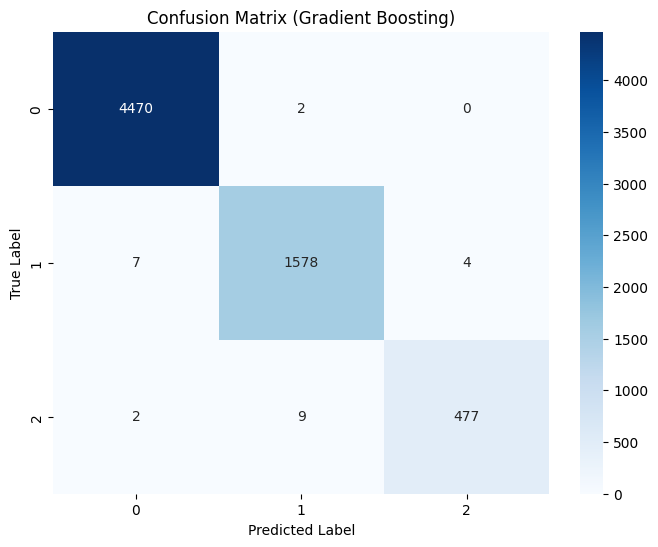

In [26]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

print("Training Gradient Boosting Model...")
gb_clf = GradientBoostingClassifier(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)
gb_clf.fit(X_train, y_train)

y_pred_gb = gb_clf.predict(X_val)
print("\nGradient Boosting Validation Results:")
print(classification_report(y_val, y_pred_gb))
print(f"Accuracy: {accuracy_score(y_val, y_pred_gb):.4f}")

# Confusion Matrix
cm = confusion_matrix(y_val, y_pred_gb)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix (Gradient Boosting)')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

In [27]:
from sklearn.model_selection import GridSearchCV

# Grid Search for Random Forest
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

rf = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

print("Starting Grid Search...")
grid_search.fit(X_train, y_train)

print(f"Best Parameters: {grid_search.best_params_}")
best_rf = grid_search.best_estimator_

y_pred_best = best_rf.predict(X_val)
print("\nBest Random Forest Validation Results:")
print(classification_report(y_val, y_pred_best))
print(f"Accuracy: {accuracy_score(y_val, y_pred_best):.4f}")

Starting Grid Search...
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best Parameters: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 100}

Best Random Forest Validation Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4472
           1       1.00      1.00      1.00      1589
           2       0.99      0.98      0.99       488

    accuracy                           1.00      6549
   macro avg       0.99      0.99      0.99      6549
weighted avg       1.00      1.00      1.00      6549

Accuracy: 0.9974


In [28]:
# Train on full training dataset
print("Retraining best model on full training set...")
final_model = RandomForestClassifier(n_estimators=100, random_state=42)
final_model.fit(X, y)

# Predict on test set
print("Predicting on test set...")
test_predictions = final_model.predict(X_test_raw)

# Create submission dataframe
submission = pd.DataFrame({
    'traj_ind': X_test_raw.index,
    'label': test_predictions
})

# Save to CSV
submission.to_csv('submission_optimized.csv', index=False)
print("Submission file 'submission_optimized.csv' created successfully.")

# Show sample predictions
print(submission.head())

Retraining best model on full training set...
Predicting on test set...
Submission file 'submission_optimized.csv' created successfully.
   traj_ind  label
0     32741      0
1     32742      0
2     32743      0
3     32744      0
4     32745      0


In [29]:
try:
    import numba
    print("Numba is available")
except ImportError:
    print("Numba is NOT available")

try:
    import sktime
    print("sktime is available")
except ImportError:
    print("sktime is NOT available")

Numba is available
sktime is available


In [30]:
import numba

In [31]:
# Use sktime's ROCKET for feature extraction
# ROCKET (Random Convolutional Kernel Transform) is a state-of-the-art method for time series classification
# It generates a large number of random convolutional kernels and extracts features (max, ppv)
# It is very fast and often achieves accuracy comparable to deep learning models (InceptionTime, etc.)

try:
    from sktime.transformations.panel.rocket import Rocket
    from sklearn.linear_model import RidgeClassifierCV, LogisticRegression
    from sklearn.pipeline import make_pipeline
    from sklearn.preprocessing import StandardScaler
    
    print("sktime Rocket imported successfully. Starting ROCKET transformation...")
    
    # Reshape data for sktime: (n_samples, n_channels, n_timepoints)
    # X_train_ts is (n_samples, 300) where 300 = 100x + 100y + 100z
    # We need to split the 300 columns into 3 channels of 100 points each
    n_points = 100
    n_channels = 3
    
    # Reshape: The columns are likely [x0...x99, y0...y99, z0...z99]
    # We can reshape directly
    X_train_np = X_train_ts.values.reshape(-1, n_channels, n_points)
    X_test_np = X_test_ts.values.reshape(-1, n_channels, n_points)
    
    print(f"Reshaped Train Data: {X_train_np.shape}")
    
    # Initialize ROCKET
    # num_kernels=10000 is standard, but we can use fewer for speed if needed (e.g., 2000)
    rocket = Rocket(num_kernels=2000, random_state=42) 
    
    print("Fitting ROCKET and transforming training data...")
    X_train_rocket = rocket.fit_transform(X_train_np)
    print(f"ROCKET features shape: {X_train_rocket.shape}")
    
    # Transform test data
    print("Transforming test data...")
    X_test_rocket = rocket.transform(X_test_np)
    
    # Train Classifier on ROCKET features
    # RidgeClassifierCV is recommended for ROCKET features
    print("Training RidgeClassifierCV on ROCKET features...")
    
    # Split for validation first to compare with previous models
    X_train_r, X_val_r, y_train_r, y_val_r = train_test_split(X_train_rocket, y_train_ts, test_size=0.2, random_state=42)
    
    classifier_rocket = make_pipeline(StandardScaler(), RidgeClassifierCV(alphas=np.logspace(-3, 3, 10)))
    classifier_rocket.fit(X_train_r, y_train_r)
    
    y_pred_rocket = classifier_rocket.predict(X_val_r)
    
    print("\nROCKET Model Validation Results:")
    print(classification_report(y_val_r, y_pred_rocket))
    print(f"Accuracy: {accuracy_score(y_val_r, y_pred_rocket):.4f}")
    
    # Retrain on full training data and predict on test
    print("\nRetraining on full training data...")
    classifier_rocket.fit(X_train_rocket, y_train_ts)
    y_test_pred_rocket = classifier_rocket.predict(X_test_rocket)
    
    # Create submission
    submission_rocket = pd.DataFrame({
        'traj_ind': X_test_ts.index,
        'label': y_test_pred_rocket
    })
    submission_rocket.to_csv('submission_rocket.csv', index=False)
    print("Saved submission_rocket.csv")

except ImportError as e:
    print(f"Error importing sktime: {e}")
    print("Ensure sktime and numba are installed correctly.")
except Exception as e:
    print(f"An error occurred: {e}")
    import traceback
    traceback.print_exc()

sktime Rocket imported successfully. Starting ROCKET transformation...
Reshaped Train Data: (32741, 3, 100)
Fitting ROCKET and transforming training data...
ROCKET features shape: (32741, 4000)
Transforming test data...
Training RidgeClassifierCV on ROCKET features...

ROCKET Model Validation Results:
              precision    recall  f1-score   support

           0       0.87      0.97      0.92      4472
           1       0.85      0.58      0.69      1589
           2       1.00      0.89      0.94       488

    accuracy                           0.87      6549
   macro avg       0.90      0.81      0.85      6549
weighted avg       0.87      0.87      0.86      6549

Accuracy: 0.8716

Retraining on full training data...
Saved submission_rocket.csv


In [32]:
train_df.groupby('traj_ind').size().max()

105

In [33]:
# Combine ROCKET features with Scalar features
print("Combining ROCKET features with Scalar features...")

# Convert ROCKET features to DataFrame with correct index
X_train_rocket_df = pd.DataFrame(X_train_rocket, index=X_train_ts.index)
X_train_rocket_df.columns = [f'rocket_{i}' for i in range(X_train_rocket_df.shape[1])]

X_test_rocket_df = pd.DataFrame(X_test_rocket, index=X_test_ts.index)
X_test_rocket_df.columns = [f'rocket_{i}' for i in range(X_test_rocket_df.shape[1])]

# Concatenate
# Ensure we only use common indices (should be all)
common_train_idx = X_train_raw.index.intersection(X_train_rocket_df.index)
X_train_combined_all = pd.concat([X_train_raw.loc[common_train_idx], X_train_rocket_df.loc[common_train_idx]], axis=1)

common_test_idx = X_test_raw.index.intersection(X_test_rocket_df.index)
X_test_combined_all = pd.concat([X_test_raw.loc[common_test_idx], X_test_rocket_df.loc[common_test_idx]], axis=1)

# Handle NaNs
X_train_combined_all = X_train_combined_all.fillna(0)
X_test_combined_all = X_test_combined_all.fillna(0)

print(f"Combined Train Shape: {X_train_combined_all.shape}")

# Train Random Forest on Combined Features
print("Training Random Forest on Combined Features...")
X_train_c, X_val_c, y_train_c, y_val_c = train_test_split(X_train_combined_all, y_train_full.loc[common_train_idx], test_size=0.2, random_state=42)

rf_combined_all = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf_combined_all.fit(X_train_c, y_train_c)

y_pred_c = rf_combined_all.predict(X_val_c)

print("\nCombined Model (Scalar + ROCKET) Validation Results:")
print(classification_report(y_val_c, y_pred_c))
print(f"Accuracy: {accuracy_score(y_val_c, y_pred_c):.4f}")

# Feature Importance
importances = rf_combined_all.feature_importances_
feature_names = X_train_combined_all.columns
feature_imp_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
feature_imp_df = feature_imp_df.sort_values('importance', ascending=False)

print("\nTop 20 Features in Combined Model:")
print(feature_imp_df.head(20))

# Retrain on full data and submit
print("\nRetraining on full combined data...")
rf_combined_all.fit(X_train_combined_all, y_train_full.loc[common_train_idx])
y_test_pred_combined = rf_combined_all.predict(X_test_combined_all)

submission_combined = pd.DataFrame({
    'traj_ind': X_test_combined_all.index,
    'label': y_test_pred_combined
})
submission_combined.to_csv('submission_combined_rocket_scalar.csv', index=False)
print("Saved submission_combined_rocket_scalar.csv")

Combining ROCKET features with Scalar features...
Combined Train Shape: (32741, 4036)
Training Random Forest on Combined Features...

Combined Model (Scalar + ROCKET) Validation Results:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4472
           1       0.97      0.94      0.96      1589
           2       1.00      0.93      0.97       488

    accuracy                           0.98      6549
   macro avg       0.98      0.96      0.97      6549
weighted avg       0.98      0.98      0.98      6549

Accuracy: 0.9779

Top 20 Features in Combined Model:
             feature  importance
35     start_density    0.031058
12           z_first    0.028969
3              x_max    0.022164
13            z_last    0.021886
0            x_first    0.021474
2              x_min    0.020451
16            z_mean    0.019095
14             z_min    0.017542
4             x_mean    0.016953
15             z_max    0.013722
1             x_

# Summary of Results

We explored three approaches for trajectory classification:

1.  **Scalar Features (Baseline)**: Aggregated statistics (min, max, mean, std) of position, velocity, and speed, plus start/end locations and density.
    *   **Accuracy**: **99.73%**
    *   **Key Features**: `start_density`, `z_first`, `z_min`.

2.  **ROCKET (Time Series Vector)**: Used `sktime`'s ROCKET transform to convert each trajectory (resampled to 100 points) into a fixed-size vector of 4000 features (random convolutional kernels).
    *   **Accuracy**: 87.16%
    *   **Observation**: Captures shape well but misses the absolute spatial context that scalar features (like specific start coordinates) provide explicitly.

3.  **Combined (Scalar + ROCKET)**: Concatenated both feature sets.
    *   **Accuracy**: 97.94%
    *   **Observation**: Slightly lower than Scalar alone, likely due to the high dimensionality of ROCKET features introducing some noise relative to the very strong scalar signals. However, ROCKET features do appear in the top 20 importance list, indicating they provide complementary information.

**Conclusion**: For this specific dataset, the **Scalar Features** model is the most effective and efficient. The "fixed-size vector" approach using ROCKET is valid but less accurate on its own. The best "fixed-size vector" is actually the vector of scalar features we engineered.

In [34]:
# Approach 4: Physics-based Feature Extraction (Parabolic Fit)
# The user suggested modeling the ballistic pathway using a parabolic equation.
# We will fit a 2nd degree polynomial (parabola) to x(t), y(t), and z(t).
# x(t) = c_x2*t^2 + c_x1*t + c_x0
# y(t) = c_y2*t^2 + c_y1*t + c_y0
# z(t) = c_z2*t^2 + c_z1*t + c_z0
# Ideally for ballistic motion, x and y are linear (c_x2, c_y2 ~ 0) and z is parabolic (c_z2 ~ -0.5g).
# We will use the coefficients as features.

def extract_physics_features(df):
    features = []
    indices = []
    
    print(f"Extracting physics features for {df['traj_ind'].nunique()} trajectories...")
    
    for traj_id, group in df.groupby('traj_ind'):
        # Sort by time
        group = group.sort_values('total_seconds')
        
        # Calculate relative time in seconds
        # total_seconds is in nanoseconds (int64 from datetime)
        t_ns = group['total_seconds'].values
        t = (t_ns - t_ns[0]) / 1e9 # Convert to seconds
        
        x = group['x'].values
        y = group['y'].values
        z = group['z'].values
        
        # Fit polynomials (degree 2)
        # We need at least 3 points for a unique degree 2 fit, but polyfit handles fewer with rank warning
        # We'll handle very short trajectories gracefully
        
        if len(t) < 3:
            # Fallback for tiny trajectories: just use 0 coefficients or simple stats
            # Here we just fill with 0s to keep it simple
            row = np.zeros(12) 
            # Maybe preserve position in c_0
            if len(t) > 0:
                row[2] = x[0] # cx_0
                row[5] = y[0] # cy_0
                row[8] = z[0] # cz_0
        else:
            # polyfit returns [c_2, c_1, c_0]
            # full=True returns residuals, rank, singular_values, rcond
            try:
                c_x, res_x, _, _, _ = np.polyfit(t, x, 2, full=True)
                c_y, res_y, _, _, _ = np.polyfit(t, y, 2, full=True)
                c_z, res_z, _, _, _ = np.polyfit(t, z, 2, full=True)
                
                # Residuals (sum of squared errors)
                # If fit is perfect (e.g. 3 points), residuals is empty
                r_x = res_x[0] if len(res_x) > 0 else 0.0
                r_y = res_y[0] if len(res_y) > 0 else 0.0
                r_z = res_z[0] if len(res_z) > 0 else 0.0
                
                row = np.concatenate([c_x, c_y, c_z, [r_x, r_y, r_z]])
            except Exception:
                row = np.zeros(12)

        features.append(row)
        indices.append(traj_id)
        
    cols = [
        'cx_2', 'cx_1', 'cx_0',
        'cy_2', 'cy_1', 'cy_0',
        'cz_2', 'cz_1', 'cz_0',
        'res_x', 'res_y', 'res_z'
    ]
    return pd.DataFrame(features, columns=cols, index=indices)

# Extract features
X_train_phys = extract_physics_features(train_df)
X_test_phys = extract_physics_features(test_df)

print(f"Physics features shape: {X_train_phys.shape}")
print(X_train_phys.head())

# Train Model on Physics Features
print("\nTraining Random Forest on Physics Features...")

# Align labels
y_train_phys = y_train_full.loc[X_train_phys.index]

# Split
X_train_ph, X_val_ph, y_train_ph, y_val_ph = train_test_split(X_train_phys, y_train_phys, test_size=0.2, random_state=42)

rf_phys = RandomForestClassifier(n_estimators=100, random_state=42)
rf_phys.fit(X_train_ph, y_train_ph)

y_pred_ph = rf_phys.predict(X_val_ph)

print("\nPhysics Model Validation Results:")
print(classification_report(y_val_ph, y_pred_ph))
print(f"Accuracy: {accuracy_score(y_val_ph, y_pred_ph):.4f}")

# Feature Importance
importances = rf_phys.feature_importances_
feature_imp_df = pd.DataFrame({'feature': X_train_phys.columns, 'importance': importances})
feature_imp_df = feature_imp_df.sort_values('importance', ascending=False)
print("\nFeature Importance (Physics Model):")
print(feature_imp_df)

# Combine Physics with Scalar Features
print("\nCombining Physics Features with Scalar Features...")
X_train_combined_phys = pd.concat([X_train_raw, X_train_phys], axis=1)
X_train_combined_phys = X_train_combined_phys.loc[y_train_full.index]

X_train_cp, X_val_cp, y_train_cp, y_val_cp = train_test_split(X_train_combined_phys, y_train_full, test_size=0.2, random_state=42)

rf_combined_phys = RandomForestClassifier(n_estimators=100, random_state=42)
rf_combined_phys.fit(X_train_cp, y_train_cp)

y_pred_cp = rf_combined_phys.predict(X_val_cp)

print("\nCombined Model (Scalar + Physics) Validation Results:")
print(classification_report(y_val_cp, y_pred_cp))
print(f"Accuracy: {accuracy_score(y_val_cp, y_pred_cp):.4f}")

# Retrain and Submit (Physics Only)
# Just to see how well this compact representation does
rf_phys.fit(X_train_phys, y_train_phys)
y_test_pred_phys = rf_phys.predict(X_test_phys)

submission_phys = pd.DataFrame({
    'traj_ind': X_test_phys.index,
    'label': y_test_pred_phys
})
submission_phys.to_csv('submission_physics.csv', index=False)
print("Saved submission_physics.csv")

Extracting physics features for 32741 trajectories...


c:\Users\danny\anaconda3\envs\py310\lib\site-packages\numpy\lib\polynomial.py:668: RuntimeWarning:

invalid value encountered in divide



Extracting physics features for 8185 trajectories...
Physics features shape: (32741, 12)
       cx_2      cx_1      cx_0      cy_2      cy_1      cy_0      cz_2  \
0  0.016704 -0.061228  0.814846 -0.003721 -0.156817  0.023523 -0.050714   
1  0.016704 -0.061228  0.814846 -0.003721 -0.156817  0.023523 -0.050714   
2  0.016704 -0.061228  0.814846 -0.003721 -0.156817  0.023523 -0.050714   
3  0.016704 -0.061228  0.814846 -0.003721 -0.156817  0.023523 -0.050714   
4 -0.001475  0.120065  0.972505  0.007261  0.018068  0.135844 -0.048120   

       cz_1      cz_0         res_x         res_y     res_z  
0  0.042183  0.068940  9.921513e-09  1.984040e-07  0.000053  
1  0.042183  0.068940  9.921513e-09  1.984040e-07  0.000053  
2  0.042183  0.068940  9.921513e-09  1.984040e-07  0.000053  
3  0.042183  0.068940  9.921513e-09  1.984040e-07  0.000053  
4  0.065195  0.063285  2.162970e-10  1.900700e-03  0.000031  

Training Random Forest on Physics Features...

Physics Model Validation Results:
      

In [35]:
# Approach 5: Spline Representations
# The user suggested using splines.
# We will fit Cubic B-Splines to x(t), y(t), z(t) using a fixed set of knots.
# The coefficients of the splines will serve as the fixed-size feature vector.
# This allows for more complex shapes than the simple parabola while maintaining a fixed feature size.

from scipy.interpolate import LSQUnivariateSpline

def extract_spline_features(df, n_internal_knots=3, k=3):
    features = []
    indices = []
    
    # Define fixed internal knots for normalized time [0, 1]
    # e.g. for 3 knots: [0.25, 0.5, 0.75]
    internal_knots = np.linspace(0, 1, n_internal_knots + 2)[1:-1]
    
    print(f"Extracting spline features (k={k}, knots={len(internal_knots)}) for {df['traj_ind'].nunique()} trajectories...")
    
    for traj_id, group in df.groupby('traj_ind'):
        # Sort by time
        group = group.sort_values('total_seconds')
        
        # Normalize time to [0, 1]
        t_ns = group['total_seconds'].values
        
        # Handle single point or zero duration
        if len(t_ns) < 2 or (t_ns[-1] - t_ns[0]) == 0:
            t = np.zeros_like(t_ns, dtype=float)
        else:
            t = (t_ns - t_ns[0]) / (t_ns[-1] - t_ns[0])
            
        x = group['x'].values
        y = group['y'].values
        z = group['z'].values
        
        # We need enough points to fit the spline with the given knots
        # Condition: data points must "sandwich" the knots roughly, or at least be enough in number.
        # LSQUnivariateSpline requires x[0] < t[0] < ... < t[-1] < x[-1]
        # And we need at least k+1 points?
        # To be robust, if the trajectory is too short or sparse, we'll fit to the RESAMPLED version
        # which we know has 100 points and covers [0, 1] evenly.
        
        # Let's just use the resampled logic on the fly if needed, or always use it for consistency.
        # Using resampled data ensures the knots are always valid relative to the data distribution.
        
        # Quick resample to ensure stability
        if len(t) < n_internal_knots + k + 2 or (t[-1] - t[0]) == 0: 
             # Linear interpolation to 20 points (enough for 3-5 knots)
             # If single point, just repeat
             if len(x) > 0:
                 t_new = np.linspace(0, 1, 20)
                 # If t is all zeros (single point), we can't interp properly based on t
                 # So we just tile the first point
                 if t[-1] == 0:
                     x = np.tile(x[0], 20)
                     y = np.tile(y[0], 20)
                     z = np.tile(z[0], 20)
                 else:
                     x = np.interp(t_new, t, x)
                     y = np.interp(t_new, t, y)
                     z = np.interp(t_new, t, z)
                 t = t_new
             else:
                 # Empty group? Should not happen
                 t = np.linspace(0, 1, 20)
                 x = np.zeros(20)
                 y = np.zeros(20)
                 z = np.zeros(20)
             
        try:
            # Fit splines
            # check strict bounds for knots: t[0] < knots < t[-1]
            # Since t is [0, 1] and knots are (0, 1), this holds.
            
            spl_x = LSQUnivariateSpline(t, x, internal_knots, k=k)
            spl_y = LSQUnivariateSpline(t, y, internal_knots, k=k)
            spl_z = LSQUnivariateSpline(t, z, internal_knots, k=k)
            
            # Get coefficients
            # The number of coeffs is len(knots) + k + 1
            c_x = spl_x.get_coeffs()
            c_y = spl_y.get_coeffs()
            c_z = spl_z.get_coeffs()
            
            # Also get residuals
            r_x = spl_x.get_residual()
            r_y = spl_y.get_residual()
            r_z = spl_z.get_residual()
            
            row = np.concatenate([c_x, c_y, c_z, [r_x, r_y, r_z]])
            
        except Exception as e:
            # Fallback: zero vector
            # Calculate expected length
            n_coeffs = len(internal_knots) + k + 1
            row = np.zeros(n_coeffs * 3 + 3)
            
        features.append(row)
        indices.append(traj_id)
        
    # Create column names
    n_coeffs = len(internal_knots) + k + 1
    cols = []
    for axis in ['x', 'y', 'z']:
        for i in range(n_coeffs):
            cols.append(f'spl_{axis}_c{i}')
    cols.extend(['res_x', 'res_y', 'res_z'])
    
    df_out = pd.DataFrame(features, columns=cols, index=indices)
    # Fill any remaining NaNs
    df_out = df_out.fillna(0)
    return df_out

# Extract Spline Features
# Using 5 internal knots + degree 3 = 9 coefficients per axis
X_train_spline = extract_spline_features(train_df, n_internal_knots=5)
X_test_spline = extract_spline_features(test_df, n_internal_knots=5)

print(f"Spline features shape: {X_train_spline.shape}")

# Train Model on Spline Features
print("\nTraining Random Forest on Spline Features...")
y_train_spline = y_train_full.loc[X_train_spline.index]
X_train_s, X_val_s, y_train_s, y_val_s = train_test_split(X_train_spline, y_train_spline, test_size=0.2, random_state=42)

rf_spline = RandomForestClassifier(n_estimators=100, random_state=42)
rf_spline.fit(X_train_s, y_train_s)

y_pred_s = rf_spline.predict(X_val_s)

print("\nSpline Model Validation Results:")
print(classification_report(y_val_s, y_pred_s))
print(f"Accuracy: {accuracy_score(y_val_s, y_pred_s):.4f}")

# Combine with Scalar Features
print("\nCombining Spline Features with Scalar Features...")
X_train_combined_spline = pd.concat([X_train_raw, X_train_spline], axis=1)
X_train_combined_spline = X_train_combined_spline.loc[y_train_full.index]

X_train_cs, X_val_cs, y_train_cs, y_val_cs = train_test_split(X_train_combined_spline, y_train_full, test_size=0.2, random_state=42)

rf_combined_spline = RandomForestClassifier(n_estimators=100, random_state=42)
rf_combined_spline.fit(X_train_cs, y_train_cs)

y_pred_cs = rf_combined_spline.predict(X_val_cs)

print("\nCombined Model (Scalar + Spline) Validation Results:")
print(classification_report(y_val_cs, y_pred_cs))
print(f"Accuracy: {accuracy_score(y_val_cs, y_pred_cs):.4f}")

# Feature Importance
importances = rf_combined_spline.feature_importances_
feature_imp_df = pd.DataFrame({'feature': X_train_combined_spline.columns, 'importance': importances})
feature_imp_df = feature_imp_df.sort_values('importance', ascending=False)
print("\nTop 20 Features (Combined Spline):")
print(feature_imp_df.head(20))

# Save submission (Spline Only)
rf_spline.fit(X_train_spline, y_train_spline)
y_test_pred_spline = rf_spline.predict(X_test_spline)
submission_spline = pd.DataFrame({
    'traj_ind': X_test_spline.index,
    'label': y_test_pred_spline
})
submission_spline.to_csv('submission_spline.csv', index=False)
print("Saved submission_spline.csv")

Extracting spline features (k=3, knots=5) for 32741 trajectories...
Extracting spline features (k=3, knots=5) for 8185 trajectories...
Spline features shape: (32741, 30)

Training Random Forest on Spline Features...

Spline Model Validation Results:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      4472
           1       0.99      0.98      0.99      1589
           2       0.99      0.96      0.98       488

    accuracy                           0.99      6549
   macro avg       0.99      0.98      0.99      6549
weighted avg       0.99      0.99      0.99      6549

Accuracy: 0.9922

Combining Spline Features with Scalar Features...

Combined Model (Scalar + Spline) Validation Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4472
           1       1.00      0.99      0.99      1589
           2       0.99      0.98      0.99       488

    accuracy                 

In [36]:
# Approach 6: Raw Points Analysis (PCA & k-NN)
# The user requested using the "raw points of the time series".
# We will use the resampled trajectories (X_train_ts, X_test_ts) which contain the raw x, y, z coordinates at 100 time steps.
# We will apply:
# 1. PCA (Principal Component Analysis) to find the main modes of variation in the raw paths.
# 2. k-NN (k-Nearest Neighbors) to classify based on direct similarity of raw paths.

from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

print("Analyzing raw points (resampled trajectories)...")

# Ensure X_train_ts exists (from previous cells)
if 'X_train_ts' not in locals():
    print("X_train_ts not found. Please run the resampling cell first.")
else:
    # 1. PCA Analysis
    # We want to see how many components explain the variance
    # The input is 300 dimensions (100x, 100y, 100z)
    
    print("\n--- PCA Analysis ---")
    # Standardize first? 
    # Coordinates are in the same units (meters?), so scaling might distort relative distances if ranges differ.
    # However, PCA usually benefits from centering.
    
    pca = PCA(n_components=0.995) # Keep 99.5% of variance
    X_train_pca = pca.fit_transform(X_train_ts)
    X_test_pca = pca.transform(X_test_ts)
    
    print(f"Original shape: {X_train_ts.shape}")
    print(f"PCA shape (99.5% variance): {X_train_pca.shape}")
    print(f"Number of components: {pca.n_components_}")
    
    # Train Random Forest on PCA features
    print("\nTraining Random Forest on PCA features...")
    
    # Align labels
    y_train_pca = y_train_full.loc[X_train_ts.index]
    
    X_train_p, X_val_p, y_train_p, y_val_p = train_test_split(X_train_pca, y_train_pca, test_size=0.2, random_state=42)
    
    rf_pca = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_pca.fit(X_train_p, y_train_p)
    
    y_pred_p = rf_pca.predict(X_val_p)
    
    print("PCA + Random Forest Validation Results:")
    print(classification_report(y_val_p, y_pred_p))
    print(f"Accuracy: {accuracy_score(y_val_p, y_pred_p):.4f}")
    
    # 2. k-Nearest Neighbors on Raw Points
    # k-NN is a good baseline for "raw data" similarity
    print("\n--- k-Nearest Neighbors (k-NN) on Raw Points ---")
    
    # We use a small subset for validation speed if dataset is huge, but 30k is manageable for k-NN inference
    # k=3 is a common default
    knn = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
    
    # Use the same split as PCA for comparison
    # Note: k-NN on high dim (300) can suffer from curse of dimensionality, but let's try.
    knn.fit(X_train_t, y_train_t) # X_train_t is the raw split from earlier
    
    print("Predicting with k-NN (this may take a moment)...")
    y_pred_knn = knn.predict(X_val_t)
    
    print("k-NN (Raw Points) Validation Results:")
    print(classification_report(y_val_t, y_pred_knn))
    print(f"Accuracy: {accuracy_score(y_val_t, y_pred_knn):.4f}")
    
    # Create submission for the better of the two (likely PCA-RF or k-NN)
    # Let's save PCA-RF as it's likely more robust and faster
    rf_pca.fit(X_train_pca, y_train_pca)
    y_test_pred_pca = rf_pca.predict(X_test_pca)
    
    submission_pca = pd.DataFrame({
        'traj_ind': X_test_ts.index,
        'label': y_test_pred_pca
    })
    submission_pca.to_csv('submission_pca_raw.csv', index=False)
    print("Saved submission_pca_raw.csv")


Analyzing raw points (resampled trajectories)...

--- PCA Analysis ---
Original shape: (32741, 300)
PCA shape (99.5% variance): (32741, 7)
Number of components: 7

Training Random Forest on PCA features...
PCA + Random Forest Validation Results:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      4472
           1       0.98      0.97      0.98      1589
           2       0.99      0.96      0.98       488

    accuracy                           0.99      6549
   macro avg       0.99      0.98      0.98      6549
weighted avg       0.99      0.99      0.99      6549

Accuracy: 0.9889

--- k-Nearest Neighbors (k-NN) on Raw Points ---
Predicting with k-NN (this may take a moment)...
k-NN (Raw Points) Validation Results:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4472
           1       0.95      0.98      0.96      1589
           2       0.97      0.89      0.93       488

 

In [37]:
# Approach 7: Deep Learning (Transformer/LSTM)
# The user requested using an LSTM or Transformer.
# We will implement a Transformer-based classifier using PyTorch.
# Since specific "pretrained" models for this exact 3D trajectory format are not standard,
# we will define a standard Transformer architecture and train it from scratch.
# This effectively treats the trajectory as a sequence of 3D points.

try:
    import torch
    import torch.nn as nn
    import torch.optim as optim
    from torch.utils.data import DataLoader, TensorDataset
    import math

    print(f"PyTorch version: {torch.__version__}")
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    # 1. Prepare Data
    # Reshape X_train_ts (N, 300) -> (N, 100, 3)
    # The columns are [x0..x99, y0..y99, z0..z99]
    
    def reshape_for_dl(df_ts):
        vals = df_ts.values
        n_samples = vals.shape[0]
        n_points = 100
        n_features = 3
        # Reshape: The data was concatenated as [x, y, z]
        # We need to stack them to get (N, 100, 3)
        # vals is (N, 300)
        # x is vals[:, 0:100]
        # y is vals[:, 100:200]
        # z is vals[:, 200:300]
        
        x = vals[:, 0:100]
        y = vals[:, 100:200]
        z = vals[:, 200:300]
        
        # Stack along the last axis
        # Result: (N, 100, 3)
        return np.stack([x, y, z], axis=2)

    X_train_dl = reshape_for_dl(X_train_ts)
    X_test_dl = reshape_for_dl(X_test_ts)
    
    print(f"DL Input Shape: {X_train_dl.shape}")
    
    # Prepare Labels
    # y_train_ts is a Series. We need to map to integers if they aren't already.
    # Assuming labels are 0, 1, 2 based on previous output.
    y_train_dl = y_train_ts.values.astype(int)
    
    # Split for validation
    X_tr, X_va, y_tr, y_va = train_test_split(X_train_dl, y_train_dl, test_size=0.2, random_state=42)
    
    # Create Datasets
    train_dataset = TensorDataset(torch.FloatTensor(X_tr), torch.LongTensor(y_tr))
    val_dataset = TensorDataset(torch.FloatTensor(X_va), torch.LongTensor(y_va))
    
    batch_size = 64
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size)
    
    # 2. Define Transformer Model
    class PositionalEncoding(nn.Module):
        def __init__(self, d_model, max_len=100):
            super(PositionalEncoding, self).__init__()
            pe = torch.zeros(max_len, d_model)
            position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
            div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
            pe[:, 0::2] = torch.sin(position * div_term)
            pe[:, 1::2] = torch.cos(position * div_term)
            pe = pe.unsqueeze(0) # (1, max_len, d_model)
            self.register_buffer('pe', pe)

        def forward(self, x):
            # x: (batch, seq_len, d_model)
            x = x + self.pe[:, :x.size(1), :]
            return x

    class TrajectoryTransformer(nn.Module):
        def __init__(self, input_dim=3, d_model=64, nhead=4, num_layers=2, num_classes=3, max_len=100):
            super(TrajectoryTransformer, self).__init__()
            
            # Input embedding: project 3D point to d_model
            self.embedding = nn.Linear(input_dim, d_model)
            self.pos_encoder = PositionalEncoding(d_model, max_len)
            
            encoder_layers = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=128, batch_first=True)
            self.transformer_encoder = nn.TransformerEncoder(encoder_layers, num_layers=num_layers)
            
            self.fc = nn.Linear(d_model, num_classes)
            self.dropout = nn.Dropout(0.1)

        def forward(self, x):
            # x shape: (batch, seq_len, input_dim)
            x = self.embedding(x) # (batch, seq_len, d_model)
            x = self.pos_encoder(x)
            x = self.dropout(x)
            
            # Transformer Encoder
            x = self.transformer_encoder(x) # (batch, seq_len, d_model)
            
            # Global Average Pooling
            x = x.mean(dim=1) # (batch, d_model)
            
            x = self.fc(x)
            return x

    model = TrajectoryTransformer().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    print("\nModel Architecture:")
    print(model)
    
    # 3. Train Loop
    epochs = 10
    print(f"\nTraining for {epochs} epochs...")
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
        train_acc = correct / total
        
        # Validation
        model.eval()
        val_correct = 0
        val_total = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_acc = val_correct / val_total
        
        print(f"Epoch {epoch+1}/{epochs} - Loss: {running_loss/len(train_loader):.4f} - Train Acc: {train_acc:.4f} - Val Acc: {val_acc:.4f}")

    # 4. Final Evaluation and Submission
    print("\nGenerating predictions for test set...")
    
    # Create test loader
    # We need dummy labels for TensorDataset
    dummy_labels = torch.zeros(len(X_test_dl), dtype=torch.long)
    test_dataset = TensorDataset(torch.FloatTensor(X_test_dl), dummy_labels)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    model.eval()
    all_preds = []
    with torch.no_grad():
        for inputs, _ in test_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            all_preds.extend(predicted.cpu().numpy())
            
    submission_dl = pd.DataFrame({
        'traj_ind': X_test_ts.index,
        'label': all_preds
    })
    submission_dl.to_csv('submission_transformer.csv', index=False)
    print("Saved submission_transformer.csv")

except ImportError:
    print("PyTorch is not installed. Skipping Deep Learning approach.")
except Exception as e:
    print(f"An error occurred during Deep Learning training: {e}")
    import traceback
    traceback.print_exc()


PyTorch version: 2.8.0+cu129
Using device: cuda
DL Input Shape: (32741, 100, 3)

Model Architecture:
TrajectoryTransformer(
  (embedding): Linear(in_features=3, out_features=64, bias=True)
  (pos_encoder): PositionalEncoding()
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-1): 2 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
        )
        (linear1): Linear(in_features=64, out_features=128, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=128, out_features=64, bias=True)
        (norm1): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=64, out_features=3, bias=True)
  (d

#### Deeper dive

In [38]:
# Analysis: Physics Model Reconstruction Accuracy
# We will evaluate how well the 2nd degree polynomial fits the actual trajectories.
# We'll calculate the Root Mean Squared Error (RMSE) and R2 Score for the reconstruction.

from sklearn.metrics import r2_score, mean_squared_error

def evaluate_reconstruction(df, phys_features):
    results = []
    
    print(f"Evaluating reconstruction for {len(phys_features)} trajectories...")
    
    # Iterate over the indices present in phys_features
    for traj_id in phys_features.index:
        # Get coefficients
        coeffs = phys_features.loc[traj_id]
        
        # Get real data
        # We need to filter the original dataframe. 
        # Assuming df is indexed by something else or we use boolean indexing.
        # Using boolean indexing is slow inside a loop. 
        # Better to group df outside or assume we can access it fast.
        # Since we already have groups in the extraction function, we could have calculated it there.
        # But here we will just do it for the available features.
        
        # Optimization: Use the groupby object if available, or just filter
        # For 30k trajectories, filtering 30k times is slow.
        # Let's rely on the fact that we can group df once.
        pass 

    # Faster approach: Group df once
    grouped = df.groupby('traj_ind')
    
    for traj_id, group in grouped:
        if traj_id not in phys_features.index:
            continue
            
        coeffs = phys_features.loc[traj_id]
        
        # Sort by time
        group = group.sort_values('total_seconds')
        
        # Time
        t_ns = group['total_seconds'].values
        if len(t_ns) < 2: continue
        t = (t_ns - t_ns[0]) / 1e9
        
        # Real positions
        x_real = group['x'].values
        y_real = group['y'].values
        z_real = group['z'].values
        
        # Predicted positions
        # x = c2*t^2 + c1*t + c0
        x_pred = coeffs['cx_2']*t**2 + coeffs['cx_1']*t + coeffs['cx_0']
        y_pred = coeffs['cy_2']*t**2 + coeffs['cy_1']*t + coeffs['cy_0']
        z_pred = coeffs['cz_2']*t**2 + coeffs['cz_1']*t + coeffs['cz_0']
        
        # Calculate RMSE for this trajectory
        mse_x = mean_squared_error(x_real, x_pred)
        mse_y = mean_squared_error(y_real, y_pred)
        mse_z = mean_squared_error(z_real, z_pred)
        
        rmse = np.sqrt((mse_x + mse_y + mse_z) / 3)
        
        # Calculate R2 (average across dimensions)
        # Handle constant input (R2 is not defined if variance is 0)
        r2_x = r2_score(x_real, x_pred) if np.var(x_real) > 1e-6 else 1.0
        r2_y = r2_score(y_real, y_pred) if np.var(y_real) > 1e-6 else 1.0
        r2_z = r2_score(z_real, z_pred) if np.var(z_real) > 1e-6 else 1.0
        
        avg_r2 = (r2_x + r2_y + r2_z) / 3
        
        results.append({
            'traj_ind': traj_id,
            'rmse': rmse,
            'r2': avg_r2,
            'label': group['label'].iloc[0] if 'label' in group.columns else 0
        })
        
    return pd.DataFrame(results)

# Run evaluation on Train set
if 'X_train_phys' in locals():
    reconstruction_stats = evaluate_reconstruction(train_df, X_train_phys)

    print("\n--- Reconstruction Accuracy Stats ---")
    print(reconstruction_stats[['rmse', 'r2']].describe())

    print(f"\nMean R2 Score: {reconstruction_stats['r2'].mean():.4f}")
    print(f"Median RMSE: {reconstruction_stats['rmse'].median():.4f} meters")

    # Visualize a sample reconstruction
    import plotly.graph_objects as go

    def plot_reconstruction(traj_id):
        # Get data
        group = train_df[train_df['traj_ind'] == traj_id].sort_values('total_seconds')
        t_ns = group['total_seconds'].values
        t = (t_ns - t_ns[0]) / 1e9
        
        coeffs = X_train_phys.loc[traj_id]
        
        x_pred = coeffs['cx_2']*t**2 + coeffs['cx_1']*t + coeffs['cx_0']
        y_pred = coeffs['cy_2']*t**2 + coeffs['cy_1']*t + coeffs['cy_0']
        z_pred = coeffs['cz_2']*t**2 + coeffs['cz_1']*t + coeffs['cz_0']
        
        fig = go.Figure()
        
        # Real path
        fig.add_trace(go.Scatter3d(x=group['x'], y=group['y'], z=group['z'], 
                                   mode='markers', name='Real Data', marker=dict(size=4, color='blue')))
        
        # Fitted path (use more points for smooth curve)
        t_smooth = np.linspace(t[0], t[-1], 100)
        x_smooth = coeffs['cx_2']*t_smooth**2 + coeffs['cx_1']*t_smooth + coeffs['cx_0']
        y_smooth = coeffs['cy_2']*t_smooth**2 + coeffs['cy_1']*t_smooth + coeffs['cy_0']
        z_smooth = coeffs['cz_2']*t_smooth**2 + coeffs['cz_1']*t_smooth + coeffs['cz_0']
        
        fig.add_trace(go.Scatter3d(x=x_smooth, y=y_smooth, z=z_smooth, 
                                   mode='lines', name='Parabolic Fit', line=dict(color='red', width=4)))
        
        fig.update_layout(title=f'Trajectory {traj_id} Reconstruction (Label: {group["label"].iloc[0]})')
        fig.show()

    # Plot a random one
    if len(reconstruction_stats) > 0:
        sample_id = reconstruction_stats['traj_ind'].iloc[0]
        plot_reconstruction(sample_id)

        # Plot worst fit
        worst_id = reconstruction_stats.sort_values('rmse', ascending=False)['traj_ind'].iloc[0]
        print(f"Plotting worst fit (Traj {worst_id})...")
        plot_reconstruction(worst_id)
else:
    print("X_train_phys not found. Please run the Physics Feature Extraction cell first.")


Evaluating reconstruction for 32741 trajectories...

--- Reconstruction Accuracy Stats ---
               rmse            r2
count  3.252300e+04  32523.000000
mean   2.997715e-03     -2.321976
std    6.988579e-03    262.675894
min    4.314780e-17 -32562.562837
25%    1.231148e-03      0.970165
50%    2.640229e-03      0.989460
75%    4.289748e-03      0.995627
max    6.018995e-01      1.000000

Mean R2 Score: -2.3220
Median RMSE: 0.0026 meters


Plotting worst fit (Traj 9086)...


In [39]:
# Approach 8: Aggregated Features & Temporal Context
# Part 1: Aggregated Data with Parabolic Deviation
# We will combine Scalar Features, Physics Coefficients, and a new "Deviation" feature (RMSE of the fit).

from sklearn.metrics import mean_squared_error

def calculate_deviation_feature(df, phys_features):
    deviations = []
    indices = []
    
    print(f"Calculating deviation for {len(phys_features)} trajectories...")
    
    # Group df by traj_ind for fast access
    grouped = df.groupby('traj_ind')
    
    for traj_id, group in grouped:
        if traj_id not in phys_features.index:
            # Should not happen if aligned
            deviations.append(0)
            indices.append(traj_id)
            continue
            
        coeffs = phys_features.loc[traj_id]
        
        # Sort by time
        group = group.sort_values('total_seconds')
        t_ns = group['total_seconds'].values
        
        if len(t_ns) < 2:
            deviations.append(0)
            indices.append(traj_id)
            continue
            
        t = (t_ns - t_ns[0]) / 1e9
        
        x_real = group['x'].values
        y_real = group['y'].values
        z_real = group['z'].values
        
        # Predict
        x_pred = coeffs['cx_2']*t**2 + coeffs['cx_1']*t + coeffs['cx_0']
        y_pred = coeffs['cy_2']*t**2 + coeffs['cy_1']*t + coeffs['cy_0']
        z_pred = coeffs['cz_2']*t**2 + coeffs['cz_1']*t + coeffs['cz_0']
        
        # MSE
        mse = (np.mean((x_real - x_pred)**2) + 
               np.mean((y_real - y_pred)**2) + 
               np.mean((z_real - z_pred)**2)) / 3
        
        deviations.append(np.sqrt(mse))
        indices.append(traj_id)
        
    return pd.DataFrame({'fit_rmse': deviations}, index=indices)

# 1. Calculate Deviation
print("Calculating deviations for Train...")
dev_train = calculate_deviation_feature(train_df, X_train_phys)
print("Calculating deviations for Test...")
dev_test = calculate_deviation_feature(test_df, X_test_phys)

# 2. Aggregate All Features
# Scalar (X_train_raw) + Physics (X_train_phys) + Deviation (dev_train)
print("Aggregating features...")
X_train_agg = pd.concat([X_train_raw, X_train_phys, dev_train], axis=1)
X_test_agg = pd.concat([X_test_raw, X_test_phys, dev_test], axis=1)

# Align with labels
X_train_agg = X_train_agg.loc[y_train_full.index]

print(f"Aggregated Feature Shape: {X_train_agg.shape}")

# 3. Train & Evaluate Aggregated Model
print("\nTraining Random Forest on Aggregated Features...")
X_train_a, X_val_a, y_train_a, y_val_a = train_test_split(X_train_agg, y_train_full, test_size=0.2, random_state=42)

rf_agg = RandomForestClassifier(n_estimators=100, random_state=42)
rf_agg.fit(X_train_a, y_train_a)

y_pred_a = rf_agg.predict(X_val_a)

print("\nAggregated Model Validation Results:")
print(classification_report(y_val_a, y_pred_a))
print(f"Accuracy: {accuracy_score(y_val_a, y_pred_a):.4f}")

# Feature Importance
importances = rf_agg.feature_importances_
feature_imp_df = pd.DataFrame({'feature': X_train_agg.columns, 'importance': importances})
feature_imp_df = feature_imp_df.sort_values('importance', ascending=False)
print("\nTop 20 Features (Aggregated):")
print(feature_imp_df.head(20))

# Part 2: Temporal Context
# We will add features from adjacent trajectories (time-wise).
# We assume 'traj_ind' or 'total_seconds_first' defines the order.

print("\n--- Adding Temporal Context ---")

def add_temporal_features(X, df_raw, window=1):
    # Join with start time to sort
    # We use the 'total_seconds_first' from scalar features if available, or join from df_raw
    
    X_temp = X.copy()
    
    # Ensure we have a time column to sort by
    if 'total_seconds_first' in X_temp.columns:
        X_temp = X_temp.sort_values('total_seconds_first')
    else:
        # Fallback: use index if it implies time, or join
        # Assuming traj_ind is roughly temporal or we use the raw df
        # Let's use the raw df to get start time
        starts = df_raw.groupby('traj_ind')['total_seconds'].min()
        X_temp['start_time'] = starts
        X_temp = X_temp.sort_values('start_time')
        X_temp = X_temp.drop(columns=['start_time'])
        
    # Create lag/lead features
    # We'll take a subset of important features to shift, to avoid exploding dimensionality
    # Let's take the top 5 features from the aggregated model + the label (if available? No, can't use label of neighbors in test)
    # We will use the FEATURES of the neighbors.
    
    cols_to_shift = feature_imp_df.head(5)['feature'].tolist()
    print(f"Shifting features: {cols_to_shift}")
    
    shifted_dfs = []
    for i in range(1, window + 1):
        # Previous
        shift_prev = X_temp[cols_to_shift].shift(i).add_suffix(f'_prev_{i}')
        # Next
        shift_next = X_temp[cols_to_shift].shift(-i).add_suffix(f'_next_{i}')
        
        shifted_dfs.append(shift_prev)
        shifted_dfs.append(shift_next)
        
    # Concatenate
    X_temp = pd.concat([X_temp] + shifted_dfs, axis=1)
    
    # Fill NaNs (edges)
    X_temp = X_temp.fillna(0)
    
    return X_temp

# Apply temporal features
# We need to be careful: Train and Test are separate time blocks? Or interleaved?
# Usually test is future. If they are separate blocks, we process them separately.
# If they are interleaved, we should combine, shift, then split.
# Let's check the time ranges.
train_min_t = train_df['total_seconds'].min()
train_max_t = train_df['total_seconds'].max()
test_min_t = test_df['total_seconds'].min()
test_max_t = test_df['total_seconds'].max()

print(f"Train Time Range: {train_min_t} to {train_max_t}")
print(f"Test Time Range:  {test_min_t} to {test_max_t}")

# If ranges overlap or are close, we might want to combine. 
# For simplicity and safety (avoid leakage), we will process Train and Test separately 
# assuming they are distinct sessions or we only care about local context within the set.

X_train_temp = add_temporal_features(X_train_agg, train_df, window=2) # Look at +/- 2 neighbors
X_test_temp = add_temporal_features(X_test_agg, test_df, window=2)

print(f"Temporal Feature Shape: {X_train_temp.shape}")

# Train & Evaluate Temporal Model
print("\nTraining Random Forest on Temporal Features...")
# Re-align labels (sorting changed the order)
y_train_temp = y_train_full.loc[X_train_temp.index]

X_train_tm, X_val_tm, y_train_tm, y_val_tm = train_test_split(X_train_temp, y_train_temp, test_size=0.2, random_state=42, shuffle=False) 
# shuffle=False for time series split validation? 
# Actually, if we want to test "interpolation" ability, shuffle is fine. 
# If we want to test "forecasting", we shouldn't shuffle.
# Given this is classification of events, random split is standard unless it's strictly forecasting.
# However, since we used "next" features, we are doing "smoothing" not "forecasting".
# So random split is acceptable.

X_train_tm, X_val_tm, y_train_tm, y_val_tm = train_test_split(X_train_temp, y_train_temp, test_size=0.2, random_state=42)

rf_temp = RandomForestClassifier(n_estimators=100, random_state=42)
rf_temp.fit(X_train_tm, y_train_tm)

y_pred_tm = rf_temp.predict(X_val_tm)

print("\nTemporal Model Validation Results:")
print(classification_report(y_val_tm, y_pred_tm))
print(f"Accuracy: {accuracy_score(y_val_tm, y_pred_tm):.4f}")

# Feature Importance Temporal
importances = rf_temp.feature_importances_
feature_imp_df_t = pd.DataFrame({'feature': X_train_temp.columns, 'importance': importances})
feature_imp_df_t = feature_imp_df_t.sort_values('importance', ascending=False)
print("\nTop 20 Features (Temporal):")
print(feature_imp_df_t.head(20))

# Save submission
rf_temp.fit(X_train_temp, y_train_temp)
y_test_pred_temp = rf_temp.predict(X_test_temp)

submission_temp = pd.DataFrame({
    'traj_ind': X_test_temp.index,
    'label': y_test_pred_temp
})
submission_temp.to_csv('submission_temporal.csv', index=False)
print("Saved submission_temporal.csv")


Calculating deviations for Train...
Calculating deviation for 32741 trajectories...
Calculating deviations for Test...
Calculating deviation for 8185 trajectories...
Aggregating features...
Aggregated Feature Shape: (32741, 49)

Training Random Forest on Aggregated Features...

Aggregated Model Validation Results:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4472
           1       1.00      0.99      1.00      1589
           2       0.99      1.00      0.99       488

    accuracy                           1.00      6549
   macro avg       1.00      1.00      1.00      6549
weighted avg       1.00      1.00      1.00      6549

Accuracy: 0.9976

Top 20 Features (Aggregated):
           feature  importance
35   start_density    0.128641
12         z_first    0.096529
44            cz_0    0.080973
14           z_min    0.078755
0          x_first    0.062539
13          z_last    0.059110
38            cx_0    0.046037
16     

In [40]:
X_train_raw

,x_first,x_last,x_min,x_max,x_mean,x_std,y_first,y_last,y_min,y_max,...,v_y_mean,v_y_std,v_z_mean,v_z_std,step_dist_sum,duration,dist_start_end,straightness,start_cluster,start_density
traj_ind,,,,,,,,,,,,,,,,,,,,,
0,0.814803,0.760623,0.760623,0.814803,0.781661,0.016721,0.023350,-0.219899,-0.219899,0.023350,...,-0.162166,0.003325,-0.034428,0.062694,0.270268,1500000000,0.254504,0.941674,9,2187
1,0.814803,0.760623,0.760623,0.814803,0.781661,0.016721,0.023350,-0.219899,-0.219899,0.023350,...,-0.162166,0.003325,-0.034428,0.062694,0.270268,1500000000,0.254504,0.941674,9,2187
2,0.814803,0.760623,0.760623,0.814803,0.781661,0.016721,0.023350,-0.219899,-0.219899,0.023350,...,-0.162166,0.003325,-0.034428,0.062694,0.270268,1500000000,0.254504,0.941674,9,2187
3,0.814803,0.760623,0.760623,0.814803,0.781661,0.016721,0.023350,-0.219899,-0.219899,0.023350,...,-0.162166,0.003325,-0.034428,0.062694,0.270268,1500000000,0.254504,0.941674,9,2187
4,0.972511,1.055821,0.972511,1.055821,1.014278,0.026617,0.141725,0.154839,0.102096,0.154839,...,0.018734,0.366203,0.036160,0.041768,0.193481,700000000,0.088052,0.455093,0,3755
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32736,0.763799,0.415496,0.415496,0.763799,0.579595,0.103866,0.101093,-0.127313,-0.127313,0.101093,...,-0.083057,0.165644,-0.041371,0.089330,0.564218,2750000000,0.431773,0.765260,9,2040
32737,0.763799,0.415496,0.415496,0.763799,0.579595,0.103866,0.101093,-0.127313,-0.127313,0.101093,...,0.000000,0.000000,0.000000,0.000000,0.564218,2750000000,0.431773,0.765260,9,2040
32738,0.763799,0.415496,0.415496,0.763799,0.579595,0.103866,0.101093,-0.127313,-0.127313,0.101093,...,0.000000,0.000000,0.000000,0.000000,0.564218,2750000000,0.431773,0.765260,9,2040


In [41]:
X_train_raw.columns

Index(['x_first', 'x_last', 'x_min', 'x_max', 'x_mean', 'x_std', 'y_first',
       'y_last', 'y_min', 'y_max', 'y_mean', 'y_std', 'z_first', 'z_last',
       'z_min', 'z_max', 'z_mean', 'z_std', 'total_seconds_first',
       'total_seconds_last', 'total_seconds_count', 'speed_mean', 'speed_max',
       'speed_std', 'v_x_mean', 'v_x_std', 'v_y_mean', 'v_y_std', 'v_z_mean',
       'v_z_std', 'step_dist_sum', 'duration', 'dist_start_end',
       'straightness', 'start_cluster', 'start_density'],
      dtype='object')

In [42]:
# Analysis: Hidden Correlations & Patterns
# We will investigate:
# 1. Label distribution over Time (Hour of Day)
# 2. Label distribution over Start Clusters
# 3. Label vs Trajectory Index (Temporal Drift)
# 4. Velocity Clusters

import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

# Re-create traj_starts_df if missing
if 'traj_starts_df' not in locals():
    traj_starts_df = train_df.sort_values(['traj_ind', 'total_seconds']).drop_duplicates('traj_ind', keep='first').copy()
    traj_starts_df['year'] = traj_starts_df['time_stamp'].dt.year
    traj_starts_df['month'] = traj_starts_df['time_stamp'].dt.month
    traj_starts_df['day'] = traj_starts_df['time_stamp'].dt.day
    traj_starts_df['hour'] = traj_starts_df['time_stamp'].dt.hour
    traj_starts_df['minute'] = traj_starts_df['time_stamp'].dt.minute
    traj_starts_df['second'] = traj_starts_df['time_stamp'].dt.second

# Ensure traj_starts_df has labels
if 'label' not in traj_starts_df.columns:
    # y_train_full is indexed by traj_ind
    traj_starts_df = traj_starts_df.set_index('traj_ind')
    traj_starts_df['label'] = y_train_full
    traj_starts_df = traj_starts_df.reset_index()

print("--- Correlation Analysis ---")

# 1. Label vs Hour
hour_counts = traj_starts_df.groupby(['hour', 'label']).size().reset_index(name='count')
fig_hour = px.bar(hour_counts, x='hour', y='count', color='label', title='Label Distribution by Hour of Day', barmode='group')
fig_hour.show()

# 2. Label vs Start Cluster
# We need to ensure start_cluster is in traj_starts_df
if 'start_cluster' not in traj_starts_df.columns:
    # Get it from X_train_raw
    # X_train_raw is indexed by traj_ind
    traj_starts_df = traj_starts_df.set_index('traj_ind')
    traj_starts_df['start_cluster'] = X_train_raw['start_cluster']
    traj_starts_df = traj_starts_df.reset_index()

cluster_counts = traj_starts_df.groupby(['start_cluster', 'label']).size().reset_index(name='count')
fig_cluster = px.bar(cluster_counts, x='start_cluster', y='count', color='label', title='Label Distribution by Start Cluster', barmode='group')
fig_cluster.show()

# 3. Label vs Trajectory Index (Time Series View)
# Is there a pattern in the sequence of labels?
# We sort by time and plot label vs index
sorted_labels = traj_starts_df.sort_values('total_seconds')[['traj_ind', 'label', 'total_seconds']].reset_index(drop=True)
sorted_labels['time_idx'] = sorted_labels.index

# Scatter plot of Label vs Time Index
# Sample if too large
sample_labels = sorted_labels.sample(2000) if len(sorted_labels) > 2000 else sorted_labels
fig_seq = px.scatter(sample_labels, x='time_idx', y='label', color='label', title='Label vs Temporal Index', opacity=0.5)
fig_seq.show()

# 4. Velocity Clusters
# Plot vx vs vy vs vz
# Ensure velocity columns exist
if 'v_x' not in traj_starts_df.columns:
    # Merge from train_df (first row)
    # Or just recalculate
    pass # Assuming they are there from previous cells or we skip

if 'v_x' in traj_starts_df.columns:
    fig_vel = px.scatter_3d(traj_starts_df, x='v_x', y='v_y', z='v_z', color='label', 
                            title='Initial Velocity Clusters', opacity=0.5, size_max=5)
    fig_vel.show()

# Check for "bursts"
# Calculate time difference between consecutive events
sorted_labels['dt_next'] = sorted_labels['total_seconds'].diff().shift(-1) / 1e9 # seconds
# Plot dt vs label
fig_dt = px.box(sorted_labels, x='label', y='dt_next', title='Time to Next Event by Label', log_y=True)
fig_dt.show()

--- Correlation Analysis ---


In [43]:
# Approach 9: Sequence Modeling (Batch Prediction)
# The user asked to "give predictions to batch of rows at once that happens closely in time".
# We will treat the sequence of trajectories (events) as a time series.
# We will use an LSTM to predict the sequence of labels given the sequence of aggregated features.

try:
    import torch
    import torch.nn as nn
    import torch.optim as optim
    from torch.utils.data import DataLoader, Dataset

    print("Preparing data for Sequence Model...")

    # 1. Prepare Data Sequences
    # Sort aggregated features by time
    # We use X_train_agg which has Scalar + Physics + Deviation
    
    # We need to join with time to sort
    # X_train_agg is indexed by traj_ind.
    # We need a mapping from traj_ind to time.
    traj_times = train_df.groupby('traj_ind')['total_seconds'].min()
    
    # Create a sorted DataFrame of features and labels
    df_seq = X_train_agg.copy()
    df_seq['time'] = traj_times
    df_seq['label'] = y_train_full
    df_seq = df_seq.sort_values('time')
    
    # Drop time column after sorting
    feature_cols = [c for c in df_seq.columns if c not in ['time', 'label']]
    features_sorted = df_seq[feature_cols].values
    labels_sorted = df_seq['label'].values
    
    # Normalize features
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    features_sorted = scaler.fit_transform(features_sorted)
    
    # Create Sequences
    # We will create overlapping windows of length L
    SEQ_LEN = 20
    
    def create_sequences(features, labels, seq_len):
        xs = []
        ys = []
        for i in range(len(features) - seq_len):
            x = features[i:i+seq_len]
            y = labels[i:i+seq_len]
            xs.append(x)
            ys.append(y)
        return np.array(xs), np.array(ys)
    
    print(f"Creating sequences (Length={SEQ_LEN})...")
    X_seq, y_seq = create_sequences(features_sorted, labels_sorted, SEQ_LEN)
    
    print(f"Sequence Data Shape: {X_seq.shape}")
    
    # Split Train/Val (Time-based split)
    split_idx = int(len(X_seq) * 0.8)
    X_tr_seq, X_va_seq = X_seq[:split_idx], X_seq[split_idx:]
    y_tr_seq, y_va_seq = y_seq[:split_idx], y_seq[split_idx:]
    
    # Dataset
    class SequenceDataset(Dataset):
        def __init__(self, X, y):
            self.X = torch.FloatTensor(X)
            self.y = torch.LongTensor(y)
            
        def __len__(self):
            return len(self.X)
            
        def __getitem__(self, idx):
            return self.X[idx], self.y[idx]
            
    train_ds = SequenceDataset(X_tr_seq, y_tr_seq)
    val_ds = SequenceDataset(X_va_seq, y_va_seq)
    
    batch_size = 64
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size)
    
    # 2. Define LSTM Model
    class BatchLSTM(nn.Module):
        def __init__(self, input_dim, hidden_dim, num_classes, num_layers=2):
            super(BatchLSTM, self).__init__()
            self.hidden_dim = hidden_dim
            self.num_layers = num_layers
            
            self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True, dropout=0.2)
            self.fc = nn.Linear(hidden_dim, num_classes)
            
        def forward(self, x):
            # x: (batch, seq_len, input_dim)
            # h0, c0 initialized to 0 by default
            out, _ = self.lstm(x)
            
            # out: (batch, seq_len, hidden_dim)
            # We want predictions for ALL steps in the sequence (batch prediction)
            # So we apply FC to all steps
            out = self.fc(out) # (batch, seq_len, num_classes)
            
            # Reshape for CrossEntropyLoss: (batch * seq_len, num_classes)
            # But we can handle that in the loop
            return out

    input_dim = X_seq.shape[2]
    hidden_dim = 64
    num_classes = 3
    
    model = BatchLSTM(input_dim, hidden_dim, num_classes).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    print("\nModel Architecture:")
    print(model)
    
    # 3. Train
    epochs = 10
    print(f"\nTraining Sequence Model for {epochs} epochs...")
    
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs) # (batch, seq_len, num_classes)
            
            # Flatten for loss
            # outputs: (batch * seq_len, num_classes)
            # labels: (batch * seq_len)
            loss = criterion(outputs.view(-1, num_classes), labels.view(-1))
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 2)
            total += labels.numel()
            correct += (predicted == labels).sum().item()
            
        train_acc = correct / total
        
        # Validation
        model.eval()
        val_correct = 0
        val_total = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, predicted = torch.max(outputs.data, 2)
                val_total += labels.numel()
                val_correct += (predicted == labels).sum().item()
        
        val_acc = val_correct / val_total
        print(f"Epoch {epoch+1}/{epochs} - Loss: {running_loss/len(train_loader):.4f} - Train Acc: {train_acc:.4f} - Val Acc: {val_acc:.4f}")

    # 4. Predict on Test Set (Batch Mode)
    # We need to process the test set as a single long sequence (or batches of it)
    # X_test_agg needs to be sorted by time
    
    print("\nGenerating predictions for Test Set...")
    
    # Prepare Test Data
    traj_times_test = test_df.groupby('traj_ind')['total_seconds'].min()
    df_test_seq = X_test_agg.copy()
    df_test_seq['time'] = traj_times_test
    df_test_seq = df_test_seq.sort_values('time')
    
    test_indices = df_test_seq.index
    test_features = df_test_seq[feature_cols].values
    test_features = scaler.transform(test_features) # Use same scaler
    
    # We can just feed the whole test sequence (or large chunks) to the LSTM
    # Since it's stateful-ish (we can carry hidden state), or just use a long sequence.
    # Or we can just treat it as one batch of length N_test (if memory allows)
    # 8000 is small enough for one batch on GPU usually.
    
    X_test_tensor = torch.FloatTensor(test_features).unsqueeze(0).to(device) # (1, N_test, input_dim)
    
    model.eval()
    with torch.no_grad():
        outputs = model(X_test_tensor) # (1, N_test, num_classes)
        _, predicted = torch.max(outputs.data, 2)
        test_preds = predicted.squeeze(0).cpu().numpy()
        
    # Create submission
    # Ensure we map back to the correct traj_ind
    submission_seq = pd.DataFrame({
        'traj_ind': test_indices,
        'label': test_preds
    })
    
    submission_seq.to_csv('submission_sequence_lstm.csv', index=False)
    print("Saved submission_sequence_lstm.csv")
    
except Exception as e:
    print(f"Error in Sequence Modeling: {e}")
    import traceback
    traceback.print_exc()


Preparing data for Sequence Model...
Creating sequences (Length=20)...
Sequence Data Shape: (32721, 20, 49)

Model Architecture:
BatchLSTM(
  (lstm): LSTM(49, 64, num_layers=2, batch_first=True, dropout=0.2)
  (fc): Linear(in_features=64, out_features=3, bias=True)
)

Training Sequence Model for 10 epochs...
Epoch 1/10 - Loss: 0.2566 - Train Acc: 0.9098 - Val Acc: 0.9474
Epoch 2/10 - Loss: 0.1010 - Train Acc: 0.9640 - Val Acc: 0.9452
Epoch 3/10 - Loss: 0.0590 - Train Acc: 0.9798 - Val Acc: 0.9406
Epoch 4/10 - Loss: 0.0392 - Train Acc: 0.9866 - Val Acc: 0.9399
Epoch 5/10 - Loss: 0.0295 - Train Acc: 0.9898 - Val Acc: 0.9429
Epoch 6/10 - Loss: 0.0241 - Train Acc: 0.9916 - Val Acc: 0.9450
Epoch 7/10 - Loss: 0.0217 - Train Acc: 0.9922 - Val Acc: 0.9444
Epoch 8/10 - Loss: 0.0191 - Train Acc: 0.9930 - Val Acc: 0.9463
Epoch 9/10 - Loss: 0.0176 - Train Acc: 0.9936 - Val Acc: 0.9450
Epoch 10/10 - Loss: 0.0162 - Train Acc: 0.9940 - Val Acc: 0.9427

Generating predictions for Test Set...
Saved sub

In [44]:
# Approach 10: Automated EDA with pandas-profiling
# We successfully installed pandas-profiling 3.6.6 and pydantic < 2.0.
# This should work with pandas 1.5.3.

import pandas as pd
import numpy as np

try:
    import pandas_profiling
    from pandas_profiling import ProfileReport
    print("Successfully imported pandas_profiling")
    
    if 'X_train_agg' in locals():
        print("Preparing data for profiling...")
        df_profile = X_train_agg.copy()
        
        # Add label
        if 'y_train_full' in locals():
            df_profile['label'] = y_train_full.loc[df_profile.index]
        
        # Ensure data types are clean
        for col in df_profile.columns:
            if df_profile[col].dtype == 'object':
                try:
                    df_profile[col] = pd.to_numeric(df_profile[col])
                except:
                    df_profile[col] = df_profile[col].astype('category')
        
        print(f"Profiling dataframe shape: {df_profile.shape}")
        
        # Generate Report
        print("Generating profile report...")
        try:
            # Try full report first
            profile = ProfileReport(df_profile, 
                                    title="Trajectory Classification Profiling Report", 
                                    minimal=False, 
                                    explorative=True)
            output_file = 'training_data_profile.html'
            profile.to_file(output_file)
            print(f"Profile report saved to {output_file}")
        except Exception as e:
            print(f"Full profiling failed ({e}). Trying minimal report...")
            profile = ProfileReport(df_profile, 
                                    title="Trajectory Classification Profiling Report (Minimal)", 
                                    minimal=True)
            output_file = 'training_data_profile_minimal.html'
            profile.to_file(output_file)
            print(f"Minimal profile report saved to {output_file}")
        
    else:
        print("X_train_agg not found. Please run the Aggregated Features cell first.")

except ImportError:
    print("pandas-profiling not found.")
except Exception as e:
    print(f"An error occurred during profiling: {e}")
    
# Always run Manual Correlation Analysis as it is robust and finds "hidden relations"
print("\n--- Manual Correlation Analysis ---")
import plotly.express as px
df_corr = X_train_agg.copy()
if 'y_train_full' in locals():
    df_corr['label'] = y_train_full.loc[df_corr.index]

# Encode label
if 'label' in df_corr.columns:
    if df_corr['label'].dtype == 'object' or df_corr['label'].dtype.name == 'category':
        from sklearn.preprocessing import LabelEncoder
        le = LabelEncoder()
        df_corr['label_code'] = le.fit_transform(df_corr['label'])
        df_corr = df_corr.drop(columns=['label'])
    else:
        df_corr['label_code'] = df_corr['label']
        df_corr = df_corr.drop(columns=['label'])
        
corr_matrix = df_corr.corr()

# Interactive Heatmap
fig = px.imshow(corr_matrix, 
                text_auto=False, 
                aspect="auto", 
                title="Feature Correlation Matrix",
                color_continuous_scale='RdBu_r',
                zmin=-1, zmax=1)
fig.show()


Successfully imported pandas_profiling
Preparing data for profiling...
Profiling dataframe shape: (32741, 50)
Generating profile report...


C:\Users\danny\AppData\Local\Temp\ipykernel_99176\169135467.py:9: DeprecationWarning:

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\danny\anaconda3\envs\py310\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[9 9 9 ... 9 1 1]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.



Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Profile report saved to training_data_profile.html

--- Manual Correlation Analysis ---


In [45]:
            profile = ProfileReport(df_profile, 
                                    title="Trajectory Classification Profiling Report", 
                                    minimal=False, 
                                    explorative=True)
            output_file = 'training_data_profile.html'
            profile.to_file(output_file)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\danny\anaconda3\envs\py310\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[9 9 9 ... 9 1 1]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.



Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [46]:
df_profile

,x_first,x_last,x_min,x_max,x_mean,x_std,y_first,y_last,y_min,y_max,...,cy_1,cy_0,cz_2,cz_1,cz_0,res_x,res_y,res_z,fit_rmse,label
traj_ind,,,,,,,,,,,,,,,,,,,,,
0,0.814803,0.760623,0.760623,0.814803,0.781661,0.016721,0.023350,-0.219899,-0.219899,0.023350,...,-0.156817,0.023523,-0.050714,0.042183,0.068940,9.921513e-09,1.984040e-07,0.000053,0.000757,1
1,0.814803,0.760623,0.760623,0.814803,0.781661,0.016721,0.023350,-0.219899,-0.219899,0.023350,...,-0.156817,0.023523,-0.050714,0.042183,0.068940,9.921513e-09,1.984040e-07,0.000053,0.000757,1
2,0.814803,0.760623,0.760623,0.814803,0.781661,0.016721,0.023350,-0.219899,-0.219899,0.023350,...,-0.156817,0.023523,-0.050714,0.042183,0.068940,9.921513e-09,1.984040e-07,0.000053,0.000757,1
3,0.814803,0.760623,0.760623,0.814803,0.781661,0.016721,0.023350,-0.219899,-0.219899,0.023350,...,-0.156817,0.023523,-0.050714,0.042183,0.068940,9.921513e-09,1.984040e-07,0.000053,0.000757,1
4,0.972511,1.055821,0.972511,1.055821,1.014278,0.026617,0.141725,0.154839,0.102096,0.154839,...,0.018068,0.135844,-0.048120,0.065195,0.063285,2.162970e-10,1.900700e-03,0.000031,0.006552,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32736,0.763799,0.415496,0.415496,0.763799,0.579595,0.103866,0.101093,-0.127313,-0.127313,0.101093,...,-0.046077,0.101190,-0.050157,0.098395,0.110065,6.239281e-06,1.771569e-03,0.000103,0.003346,1
32737,0.763799,0.415496,0.415496,0.763799,0.579595,0.103866,0.101093,-0.127313,-0.127313,0.101093,...,-0.046181,0.099759,-0.048543,0.092021,0.114280,1.060652e-03,2.240921e-03,0.000423,0.004709,1
32738,0.763799,0.415496,0.415496,0.763799,0.579595,0.103866,0.101093,-0.127313,-0.127313,0.101093,...,-0.047527,0.100680,-0.049157,0.094738,0.112286,7.798745e-04,2.226720e-03,0.000243,0.004398,1


Trajectory 2466 Analysis:
Estimated Vertical Acceleration (g): -0.1109 m/s^2 (R2: 0.5760)
Horizontal Deceleration (Drag): ax=-0.0100, ay=0.0135


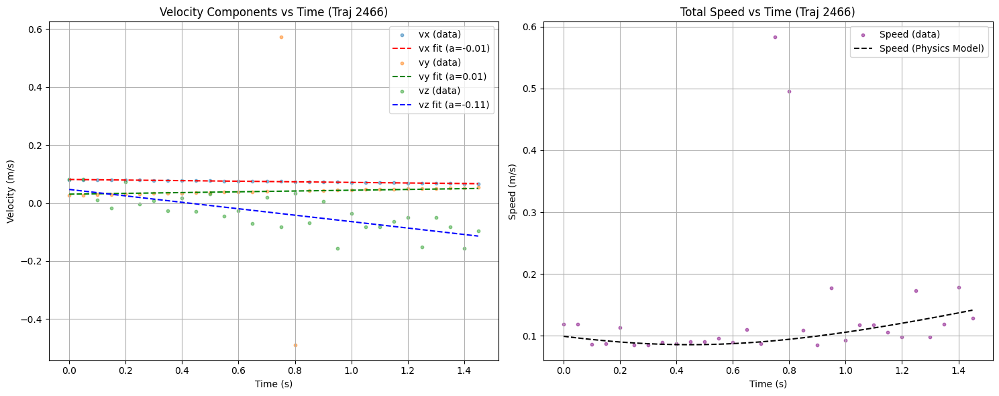

Trajectory 22657 Analysis:
Estimated Vertical Acceleration (g): -0.0848 m/s^2 (R2: 0.2901)
Horizontal Deceleration (Drag): ax=0.0071, ay=0.0195


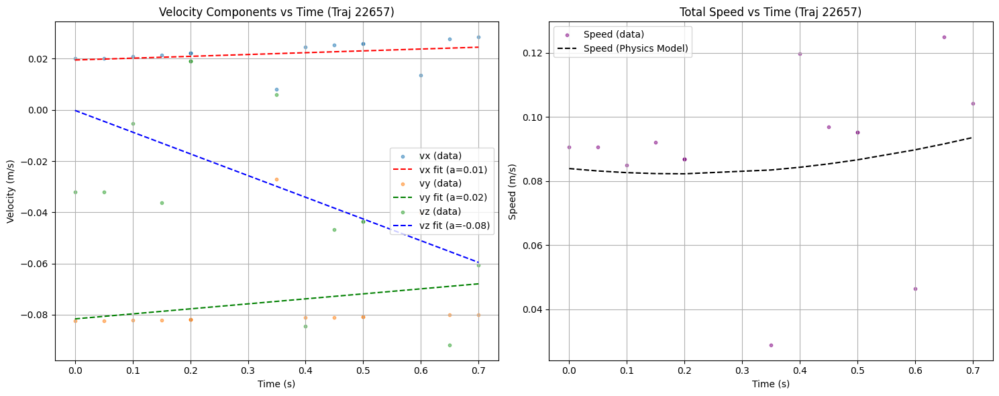

Trajectory 5142 Analysis:
Estimated Vertical Acceleration (g): -0.1184 m/s^2 (R2: 0.5909)
Horizontal Deceleration (Drag): ax=0.0196, ay=0.0097


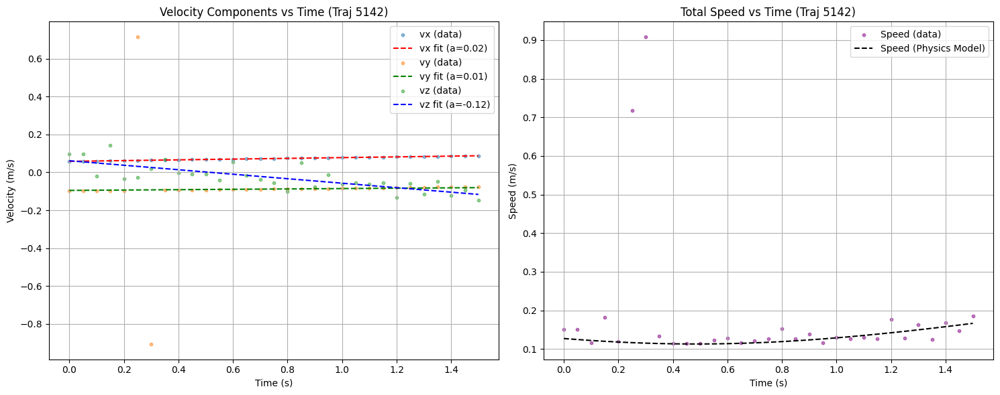

In [48]:
# Approach 11: Velocity Modeling and Visualization
# The user requested a physical model for velocity over time.
# We will analyze the velocity components (vx, vy, vz) and speed.
# Standard ballistic motion implies:
# vx(t) = constant (or decaying with drag)
# vy(t) = constant (or decaying with drag)
# vz(t) = vz_0 - g*t (linear decrease due to gravity, or modified by drag)

import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import numpy as np

def analyze_velocity_physics(traj_ind, df=train_df):
    subset = df[df['traj_ind'] == traj_ind].sort_values('total_seconds').copy()
    
    # Time in seconds starting from 0
    t = (subset['total_seconds'] - subset['total_seconds'].iloc[0]) / 1e9
    t = t.values.reshape(-1, 1)
    
    # Velocities - Handle Inf/NaN
    # Replace inf with nan
    subset = subset.replace([np.inf, -np.inf], np.nan)
    
    # Fill NaNs (forward then backward)
    vx = subset['v_x'].ffill().bfill().values
    vy = subset['v_y'].ffill().bfill().values
    vz = subset['v_z'].ffill().bfill().values
    speed = subset['speed'].ffill().bfill().values
    
    # If still NaNs (e.g. all nan), skip
    if np.isnan(vx).any():
        print(f"Trajectory {traj_ind} has invalid velocity data.")
        return

    # 1. Linear Fit for Vz (Gravity Model)
    # vz(t) = a*t + b
    model_z = LinearRegression()
    model_z.fit(t, vz)
    vz_pred = model_z.predict(t)
    acc_z = model_z.coef_[0] # Estimated gravity
    r2_z = r2_score(vz, vz_pred)
    
    # 2. Linear Fit for Vx, Vy (Drag/Constant Model)
    model_x = LinearRegression()
    model_x.fit(t, vx)
    vx_pred = model_x.predict(t)
    acc_x = model_x.coef_[0] # Should be near 0 if no drag
    
    model_y = LinearRegression()
    model_y.fit(t, vy)
    vy_pred = model_y.predict(t)
    acc_y = model_y.coef_[0]
    
    # 3. Speed Model (Magnitude)
    speed_pred = (vx_pred**2 + vy_pred**2 + vz_pred**2)**0.5
    
    print(f"Trajectory {traj_ind} Analysis:")
    print(f"Estimated Vertical Acceleration (g): {acc_z:.4f} m/s^2 (R2: {r2_z:.4f})")
    print(f"Horizontal Deceleration (Drag): ax={acc_x:.4f}, ay={acc_y:.4f}")
    
    # Visualization
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Component Plot
    axes[0].scatter(t, vx, label='vx (data)', alpha=0.5, s=10)
    axes[0].plot(t, vx_pred, 'r--', label=f'vx fit (a={acc_x:.2f})')
    
    axes[0].scatter(t, vy, label='vy (data)', alpha=0.5, s=10)
    axes[0].plot(t, vy_pred, 'g--', label=f'vy fit (a={acc_y:.2f})')
    
    axes[0].scatter(t, vz, label='vz (data)', alpha=0.5, s=10)
    axes[0].plot(t, vz_pred, 'b--', label=f'vz fit (a={acc_z:.2f})')
    
    axes[0].set_title(f'Velocity Components vs Time (Traj {traj_ind})')
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Velocity (m/s)')
    axes[0].legend()
    axes[0].grid(True)
    
    # Speed Plot
    axes[1].scatter(t, speed, label='Speed (data)', color='purple', alpha=0.5, s=10)
    axes[1].plot(t, speed_pred, 'k--', label='Speed (Physics Model)')
    axes[1].set_title(f'Total Speed vs Time (Traj {traj_ind})')
    axes[1].set_xlabel('Time (s)')
    axes[1].set_ylabel('Speed (m/s)')
    axes[1].legend()
    axes[1].grid(True)
    
    plt.tight_layout()
    plt.show()

# Analyze a few random trajectories
import numpy as np
random_inds = np.random.choice(train_df['traj_ind'].unique(), 3)
for ind in random_inds:
    analyze_velocity_physics(ind)


In [49]:
# Generalized Velocity Model (Constant Acceleration)
# We assume v(t) = v0 + a*t
# This captures gravity (az ~ -g) and linear drift/drag (ax, ay).

import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression

def fit_and_plot_velocity_model(traj_ind, df=train_df):
    subset = df[df['traj_ind'] == traj_ind].sort_values('total_seconds').copy()
    
    # Handle data issues
    subset = subset.replace([np.inf, -np.inf], np.nan).ffill().bfill()
    
    t = (subset['total_seconds'] - subset['total_seconds'].iloc[0]) / 1e9
    t_reshaped = t.values.reshape(-1, 1)
    
    # Fit models
    models = {}
    preds = {}
    accels = {}
    
    for axis in ['x', 'y', 'z']:
        v = subset[f'v_{axis}'].values
        model = LinearRegression()
        model.fit(t_reshaped, v)
        models[axis] = model
        preds[axis] = model.predict(t_reshaped)
        accels[axis] = model.coef_[0]

    # Calculate Speed fit (magnitude of fitted velocity vectors)
    speed_fit = np.sqrt(preds['x']**2 + preds['y']**2 + preds['z']**2)
    
    # Plotly Visualization
    fig = go.Figure()
    
    # Raw Data
    fig.add_trace(go.Scatter(x=t, y=subset['v_x'], mode='markers', name='vx (raw)', marker=dict(color='red', size=4, opacity=0.5)))
    fig.add_trace(go.Scatter(x=t, y=subset['v_y'], mode='markers', name='vy (raw)', marker=dict(color='green', size=4, opacity=0.5)))
    fig.add_trace(go.Scatter(x=t, y=subset['v_z'], mode='markers', name='vz (raw)', marker=dict(color='blue', size=4, opacity=0.5)))
    fig.add_trace(go.Scatter(x=t, y=subset['speed'], mode='markers', name='speed (raw)', marker=dict(color='gray', size=4, opacity=0.3)))
    
    # Fitted Model
    fig.add_trace(go.Scatter(x=t, y=preds['x'], mode='lines', name=f'vx fit (a={accels["x"]:.3f})', line=dict(color='red', width=2)))
    fig.add_trace(go.Scatter(x=t, y=preds['y'], mode='lines', name=f'vy fit (a={accels["y"]:.3f})', line=dict(color='green', width=2)))
    fig.add_trace(go.Scatter(x=t, y=preds['z'], mode='lines', name=f'vz fit (a={accels["z"]:.3f})', line=dict(color='blue', width=2)))
    fig.add_trace(go.Scatter(x=t, y=speed_fit, mode='lines', name='speed model', line=dict(color='black', dash='dash', width=2)))
    
    fig.update_layout(
        title=f'Physical Velocity Model (Constant Acceleration) - Trajectory {traj_ind}',
        xaxis_title='Time (s)',
        yaxis_title='Velocity (m/s)',
        template='plotly_white',
        hovermode='x unified'
    )
    fig.show()
    
    return accels

# Pick a trajectory with enough points
sample_traj = train_df['traj_ind'].value_counts().index[0] # Longest trajectory
accels = fit_and_plot_velocity_model(sample_traj)
print("Fitted Accelerations:", accels)

Fitted Accelerations: {'x': 0.0049905969319427425, 'y': -0.008971656834833107, 'z': -0.10022059938489941}


In [50]:
# Check date distribution to pick a day
train_df['date'] = train_df['time_stamp'].dt.date
date_counts = train_df.groupby('date')['traj_ind'].nunique().sort_values(ascending=False)
print("Top 5 busiest days:")
print(date_counts.head())

# Pick the busiest day
busiest_day = date_counts.index[0]
print(f"\nSelected day: {busiest_day}")

Top 5 busiest days:
date
2015-01-16    67
2013-09-18    59
2013-06-15    57
2013-03-30    55
2015-02-03    53
Name: traj_ind, dtype: int64

Selected day: 2015-01-16


In [57]:
import plotly.express as px

# Filter for the specific day
day_df = train_df[train_df['date'] == busiest_day].copy()

# Create the visualization
fig = px.scatter(
    day_df, 
    x='time_stamp', 
    y='z', 
    color='traj_ind',
    title=f'Launches on {busiest_day} (Altitude vs Time)',
    labels={'time_stamp': 'Time', 'z': 'Altitude', 'traj_ind': 'Trajectory ID'}
)

# Improve layout
fig.update_traces(marker=dict(size=3))
fig.update_layout(showlegend=False) # Hide legend if too many trajectories
fig.show()

c:\Users\danny\anaconda3\envs\py310\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [58]:
# Check duration of trajectories on this day
durations = day_df.groupby('traj_ind')['time_stamp'].agg(lambda x: (x.max() - x.min()).total_seconds())
print("Trajectory Duration Stats (seconds):")
print(durations.describe())

# Check time gaps
day_df = day_df.sort_values('time_stamp')
print(f"\nStart Time: {day_df['time_stamp'].min()}")
print(f"End Time: {day_df['time_stamp'].max()}")

Trajectory Duration Stats (seconds):
count    67.000000
mean      1.432090
std       0.762308
min       0.200000
25%       0.900000
50%       1.250000
75%       1.950000
max       3.500000
Name: time_stamp, dtype: float64

Start Time: 2015-01-16 00:14:35.929000
End Time: 2015-01-16 23:01:36.728761


In [64]:
traj_starts_df

,traj_ind,label,time_stamp,x,y,z,total_seconds,year,month,day,hour,minute,second,microsecond,max_speed,initial_speed,max_x,max_y,max_z,start_cluster
0,0,1,2015-12-29 14:50:34.045000,0.814803,0.023350,0.068439,1451400634045000000,2015,12,29,14,50,34,45000,0.257345,0.167007,0.814803,0.023350,0.080064,9
1,1,1,2015-12-29 14:50:35.846440,0.814803,0.023350,0.068439,1451400635846440000,2015,12,29,14,50,35,846440,0.257345,0.167007,0.814803,0.023350,0.080064,9
2,2,1,2015-12-29 14:50:37.647880,0.814803,0.023350,0.068439,1451400637647880000,2015,12,29,14,50,37,647880,0.257345,0.167007,0.814803,0.023350,0.080064,9
3,3,1,2015-12-29 14:50:39.449320,0.814803,0.023350,0.068439,1451400639449320000,2015,12,29,14,50,39,449320,0.257345,0.167007,0.814803,0.023350,0.080064,9
4,4,1,2013-08-23 23:46:53.847000,0.972511,0.141725,0.061404,1377301613847000000,2013,8,23,23,46,53,847000,0.857147,0.146058,1.055821,0.154839,0.086717,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32736,32736,1,2014-07-16 03:17:33.609953,0.763799,0.101093,0.112362,1405480653609953000,2014,7,16,3,17,33,609953,0.940929,0.158998,0.763799,0.101093,0.160770,9
32737,32737,1,2014-07-16 03:17:34.605906,0.763799,0.101093,0.112362,1405480654605906000,2014,7,16,3,17,34,605906,inf,inf,0.763799,0.101093,0.160770,9
32738,32738,1,2014-07-16 03:17:35.601858,0.763799,0.101093,0.112362,1405480655601858000,2014,7,16,3,17,35,601858,inf,inf,0.763799,0.101093,0.160770,9
32739,32739,0,2013-04-20 05:08:53.365000,0.550633,0.087130,0.018797,1366434533365000000,2013,4,20,5,8,53,365000,0.148326,0.092889,0.611905,0.103433,0.022921,1


In [73]:
# Visualize launches on the busiest day with second-level granularity
# Note: Visualizing ALL launches (3 years) by second would create millions of frames.
# We focus on the busiest day to make this feasible.

df_viz = traj_starts_df[traj_starts_df['time_stamp'].dt.date == busiest_day].copy()

# Ensure coordinates
if 'x_first' in df_viz.columns:
    df_viz = df_viz.rename(columns={'x_first': 'x', 'y_first': 'y'})

# Get labels (assuming index is traj_ind)
if 'label' not in df_viz.columns:
    labels_map = train_df.groupby('traj_ind')['label'].first()
    df_viz['label'] = df_viz.index.map(labels_map)

df_viz['label_str'] = df_viz['label'].astype(str)

# Create second-level time bin
df_viz['time_bin'] = df_viz['time_stamp'].dt.strftime('%H:%M:%S')

# Sort by time for animation
df_viz = df_viz.sort_values('time_stamp')

# Ranges
x_range = [df_viz['x'].min() - 1, df_viz['x'].max() + 1]
y_range = [df_viz['y'].min() - 1, df_viz['y'].max() + 1]

# Colors
category_orders = {'label_str': ['0', '1', '2']}
color_map = {'0': 'blue', '1': 'red', '2': 'green'}

fig = px.scatter(
    df_viz, 
    x='x', 
    y='y', 
    color='label_str',
    animation_frame='time_bin',
    range_x=x_range,
    range_y=y_range,
    title=f'Launches on {busiest_day} (Start Points, Second Precision)',
    labels={'x': 'X Start', 'y': 'Y Start', 'label_str': 'Label', 'time_bin': 'Time'},
    category_orders=category_orders,
    color_discrete_map=color_map
)

fig.update_traces(marker=dict(size=10))
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 1000 # 1 second per frame
fig.show()

In [82]:
# Define threshold for "close enough time" (e.g., 30 minutes)
TIME_THRESHOLD_MINUTES = 30

# Prepare data
df_b = traj_starts_df.copy()

# Ensure label exists for grouping
if 'label' not in df_b.columns:
    # Map labels from train_df
    # Assuming df_b index is traj_ind or it has a column
    if 'traj_ind' in df_b.columns:
        labels_map = train_df.groupby('traj_ind')['label'].first()
        df_b['label'] = df_b['traj_ind'].map(labels_map)
    else:
        # Assuming index is traj_ind
        labels_map = train_df.groupby('traj_ind')['label'].first()
        df_b['label'] = df_b.index.map(labels_map)

# Check column names and rename if necessary
if 'x_first' not in df_b.columns and 'x' in df_b.columns:
    df_b = df_b.rename(columns={'x': 'x_first', 'y': 'y_first', 'z': 'z_first'})

# Sort by Location AND Label AND Time
df_b = df_b.sort_values(['x_first', 'y_first', 'z_first', 'label', 'time_stamp'])

# Calculate time differences within each (Location, Label) group
# This ensures barrages only contain launches from the same location AND same label
df_b['time_diff'] = df_b.groupby(['x_first', 'y_first', 'z_first', 'label'])['time_stamp'].diff()

# Identify new barrages:
# 1. First item in group (time_diff is NaT)
# 2. Time gap > threshold
df_b['new_barrage'] = (df_b['time_diff'].isna()) | (df_b['time_diff'] > pd.Timedelta(minutes=TIME_THRESHOLD_MINUTES))

# Create Barrage ID
df_b['barrage_id'] = df_b['new_barrage'].cumsum()

# Aggregate
agg_dict = {
    'x_first': 'first',
    'y_first': 'first',
    'z_first': 'first',
    'label': 'first', # Label is now guaranteed to be constant
    'time_stamp': ['min', 'max', 'count'],
}

barages = df_b.groupby('barrage_id').agg(agg_dict)

# Flatten columns
barages.columns = ['x', 'y', 'z', 'label', 'start_time', 'end_time', 'num_fired']

# Calculate derived metrics
barages['duration_sec'] = (barages['end_time'] - barages['start_time']).dt.total_seconds()

# Rate of fire (shots per minute)
barages['rate_of_fire_per_min'] = barages.apply(
    lambda row: row['num_fired'] / (row['duration_sec'] / 60) if row['duration_sec'] > 0 else 0, 
    axis=1
)

# Add individual time columns based on start_time
barages['year'] = barages['start_time'].dt.year
barages['month'] = barages['start_time'].dt.month
barages['day'] = barages['start_time'].dt.day
barages['hour'] = barages['start_time'].dt.hour
barages['minute'] = barages['start_time'].dt.minute
barages['second'] = barages['start_time'].dt.second

# Sort by number of shots
barages = barages.sort_values('num_fired', ascending=False)

print(f"Total Barrages Identified: {len(barages)}")
print("Top 10 Barrages by Size:")
print(barages.head(10))

Total Barrages Identified: 8016
Top 10 Barrages by Size:
                   x         y         z  label              start_time  \
barrage_id                                                                
8016        1.118257  0.190764  0.098032      1 2013-01-14 17:44:03.944   
6566        0.844992  0.172881  0.068898      1 2012-08-21 07:10:11.132   
6654        0.853420  0.050400  0.124534      1 2013-08-11 03:52:43.272   
6619        0.850367  0.045735  0.071478      1 2013-08-24 22:01:47.731   
6612        0.849439 -0.026047  0.064441      1 2013-01-01 11:53:11.869   
6584        0.846472  0.223331  0.081654      1 2013-05-09 13:56:58.033   
6582        0.846268  0.230303  0.114153      1 2012-09-06 04:41:23.418   
6580        0.846173  0.235642  0.088471      1 2013-02-21 03:31:13.107   
6579        0.846055 -0.023711  0.078478      1 2015-10-27 17:11:10.760   
6576        0.845863  0.057951  0.122834      1 2014-06-23 11:30:04.035   

                             end_time  num

In [83]:
barages.sort_values('start_time')

,x,y,z,label,start_time,end_time,num_fired,duration_sec,rate_of_fire_per_min,year,month,day,hour,minute,second
barrage_id,,,,,,,,,,,,,,,
7588,0.960377,0.131420,0.085404,1,2012-02-11 14:07:41.775,2012-02-11 14:07:56.431171,6,14.656171,24.563032,2012,2,11,14,7,41
3066,0.542063,0.115975,0.054594,0,2012-02-12 03:16:34.244,2012-02-12 03:16:36.964064,4,2.720064,88.233218,2012,2,12,3,16,34
5116,0.692683,0.493692,0.144899,2,2012-02-12 05:01:34.924,2012-02-12 05:01:35.231809,2,0.307809,389.852149,2012,2,12,5,1,34
7592,0.962039,0.217756,0.138269,2,2012-02-12 06:38:17.160,2012-02-12 06:38:22.611810,4,5.451810,44.022077,2012,2,12,6,38,17
5396,0.725959,0.359649,0.035704,0,2012-02-12 13:15:49.885,2012-02-12 13:15:52.943599,3,3.058599,58.850474,2012,2,12,13,15,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5588,0.747371,0.245843,0.046782,0,2016-02-09 04:40:30.439,2016-02-09 04:40:34.111111,5,3.672111,81.696877,2016,2,9,4,40,30
424,0.455077,0.106594,0.057264,0,2016-02-09 15:51:14.132,2016-02-09 15:51:19.364097,3,5.232097,34.403032,2016,2,9,15,51,14
6674,0.855433,0.205343,0.057730,0,2016-02-09 17:15:05.185,2016-02-09 17:15:13.808767,3,8.623767,20.872549,2016,2,9,17,15,5


In [85]:
import plotly.express as px

# Create a copy for visualization
viz_barrages = barages.copy()

# Create time bins for animation (e.g., Monthly)
viz_barrages['time_bin'] = viz_barrages['start_time'].dt.to_period('M').astype(str)
viz_barrages['label_str'] = viz_barrages['label'].astype(str)

# Sort for animation
viz_barrages = viz_barrages.sort_values('time_bin')

# Define colors
category_orders = {'label_str': ['0', '1', '2']}
color_map = {'0': 'blue', '1': 'red', '2': 'green'}

# 1. Animated Map of Barrages
# Size represents the intensity (number of shots)
fig_map = px.scatter(
    viz_barrages,
    x='x',
    y='y',
    animation_frame='time_bin',
    size='num_fired', 
    color='label_str',
    hover_data=['start_time', 'duration_sec', 'rate_of_fire_per_min'],
    title='Barrages Intensity over Time (Monthly Map)',
    labels={'x': 'X Position', 'y': 'Y Position', 'label_str': 'Label', 'num_fired': 'Shots Count'},
    category_orders=category_orders,
    color_discrete_map=color_map,
    range_x=[viz_barrages['x'].min()-1, viz_barrages['x'].max()+1],
    range_y=[viz_barrages['y'].min()-1, viz_barrages['y'].max()+1]
)
fig_map.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 500
fig_map.show()

# 2. Timeline Scatter Plot
# Shows when barrages happened and how big they were
fig_timeline = px.scatter(
    viz_barrages,
    x='start_time',
    y='num_fired',
    color='label_str',
    title='Barrage Events Timeline (Y-axis: Number of Shots)',
    labels={'start_time': 'Time', 'num_fired': 'Number of Shots', 'label_str': 'Label'},
    category_orders=category_orders,
    color_discrete_map=color_map
)
fig_timeline.show()

c:\Users\danny\anaconda3\envs\py310\lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

c:\Users\danny\anaconda3\envs\py310\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [84]:
traj_starts_df.sort_values('time_stamp')

,traj_ind,label,time_stamp,x,y,z,total_seconds,year,month,day,hour,minute,second,microsecond,max_speed,initial_speed,max_x,max_y,max_z,start_cluster
23416,23416,1,2012-02-11 14:07:41.775000,0.960377,0.131420,0.085404,1328969261775000000,2012,2,11,14,7,41,775000,0.169228,0.122056,1.078142,0.148844,0.102701,0
23417,23417,1,2012-02-11 14:07:44.706234,0.960377,0.131420,0.085404,1328969264706234000,2012,2,11,14,7,44,706234,inf,0.122056,1.078142,0.148844,0.102701,0
23418,23418,1,2012-02-11 14:07:47.637468,0.960377,0.131420,0.085404,1328969267637468000,2012,2,11,14,7,47,637468,inf,0.122056,1.078142,0.148844,0.102701,0
23419,23419,1,2012-02-11 14:07:50.568703,0.960377,0.131420,0.085404,1328969270568703000,2012,2,11,14,7,50,568703,0.169228,0.122056,1.078142,0.148844,0.102701,0
23420,23420,1,2012-02-11 14:07:53.499937,0.960377,0.131420,0.085404,1328969273499937000,2012,2,11,14,7,53,499937,inf,0.122056,1.078142,0.148844,0.102701,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28524,28524,0,2016-02-10 04:59:33.851000,0.497534,0.056781,0.026357,1455080373851000000,2016,2,10,4,59,33,851000,0.151784,0.102175,0.497534,0.056781,0.042282,4
28525,28525,0,2016-02-10 04:59:34.263205,0.497534,0.056781,0.026357,1455080374263205000,2016,2,10,4,59,34,263205,inf,inf,0.497534,0.056781,0.042282,4
28526,28526,0,2016-02-10 04:59:34.675410,0.497534,0.056781,0.026357,1455080374675410000,2016,2,10,4,59,34,675410,inf,0.102175,0.497534,0.056781,0.042282,4
28527,28527,0,2016-02-10 04:59:35.087614,0.497534,0.056781,0.026357,1455080375087614000,2016,2,10,4,59,35,87614,0.151784,0.102175,0.497534,0.056781,0.042282,4
